# Preprocessing the data used for plotting

The data used in this study is far too large to provide the raw data for reproducing the plots.
In this notebook I process raw data and large preprocessed datasets (like the transformed yearly output) into datasets, that can be archived to zenodo and used for plotting.

These cells can only be executed on Princetons [tigressdata]() or [tigercpu]()

<!-- 

Mostly correcting small inconsistencies from the monster script, verifying and calculating derived properties.

Ultimately this nb should produce the data that is delivered with the reproducible repo, but for now the full output is quite large, I think.

## TODO
- recalculate the historical time averages for the z data?
- This is loadind all the data somehwere, make sure this is all 'daskefied'
- Can I just add the linear trends from 'omz_thickness' up like the differences? Otherwise I have to add the layers together and then calculate the trend.

- reorganize the ouptput data:
    - 1st level: Save out the raw data with time and globally (this should all be moved to proper preprocessing)
    - 2nd level: Save out all the 'finalized' data relevant to the Pacific (omzvol time series, trends, historical averages) -->

In [5]:
%load_ext autoreload
%autoreload 2

# Load the data
import pathlib
import numpy as np
import xarray as xr
import dask
import matplotlib.pyplot as plt

import warnings
from fastprogress.fastprogress import progress_bar

from dask.diagnostics import ProgressBar

from xarrayutils.file_handling import maybe_create_folder, write

from xarrayutils.utils import linear_trend
from aguadv_omz_busecke_2021.cmip6_stash import detrend_basic, replace_time, regrid_horizontal, mask_pacific
from aguadv_omz_busecke_2021.omz_tools import region, omz_volume, add_aou, convert_mol_m3_mymol_kg
from aguadv_omz_busecke_2021.xarrayutils_stash import load_data_to_nested_dict, flatten_dict

# dask.config.set(**{'array.slicing.split_large_chunks': True, 'array.chunk-size': '1GiB'})
dask.config.set(**{'array.slicing.split_large_chunks': False, 'array.chunk-size': '1GiB'})

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
def omz_to_plot(ds, freq, sigma):
    da = region(ds)
    da = omz_volume(da).sel(o2_bin=80)
    da = da.isel(sigma_0=sigma)
    if freq:
        da = da.resample(time=freq).mean()
    return da

In [4]:
# the data is still located in another local repo on the princeton machine

overwrite = False
ddir = pathlib.Path('/home/jbusecke/projects/aguadv_omz_busecke_2021/data/processed/density_remapping_time_yearly_final/') # !! should be updated if data is regenerated
ddict = flatten_dict(load_data_to_nested_dict(ddir, match='*.zarr', sep='_', consolidated=True, use_cftime=True), sep='_')

Loading CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r10i1p1f1.zarr
Loading CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r7i1p1f1.zarr
Loading CMIP_CCCma_CanESM5_historical_Omon_gn_v20190429_r7i1p1f1.zarr
Loading CMIP_MPI-M_MPI-ESM1-2-LR_historical_Omon_gn_none_r4i1p1f1.zarr
Loading ScenarioMIP_MPI-M_MPI-ESM1-2-LR_ssp585_Omon_gn_none_r10i1p1f1.zarr
Loading ScenarioMIP_CCCma_CanESM5-CanOE_ssp585_Omon_gn_v20190429_r3i1p2f1.zarr
Loading CMIP_CCCma_CanESM5_historical_Omon_gn_v20190429_r4i1p2f1.zarr
Loading ScenarioMIP_CCCma_CanESM5_ssp585_Omon_gn_v20190429_r6i1p1f1.zarr
Loading CMIP_CCCma_CanESM5_historical_Omon_gn_v20190429_r13i1p1f1.zarr
Loading CMIP_MPI-M_MPI-ESM1-2-LR_historical_Omon_gn_none_r3i1p1f1.zarr
Loading ScenarioMIP_MOHC_UKESM1-0-LL_ssp585_Omon_gn_none_r2i1p1f2.zarr
Loading CMIP_CSIRO_ACCESS-ESM1-5_historical_Omon_gn_v20200529_r9i1p1f1.zarr
Loading CMIP_CCCma_CanESM5_historical_Omon_gn_v20190429_r5i1p2f1.zarr
Loading ScenarioMIP_CCCma_CanESM5_ssp585_Omon_gn_v20190429_r6i1p

The processed data has missing member_ids. Ill just plug them in there from the filename for now, but ultimately this should be fixed in the upstream data.

In [7]:
def parse_member_id(name, ds):
    member_id = name.split('_')[-1]
    if 'member_id' not in ds.dims:
        print(f"no member id in dims for {name}")
    else:
        print(f"Found {ds.member_id.data} for {name}")
        
    ds = ds.assign_coords(member_id=xr.DataArray([member_id], dims=['member_id']))
    return ds

ddict_preprocessed = {k:parse_member_id(k,ds) for k, ds in ddict.items()}

Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r10i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r7i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r20i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r16i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r9i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r22i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r31i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r6i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r25i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r11i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r23i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r17i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_gn_none_r3i1p1f1
Found ['0'] for CMIP_IPSL_IPSL-CM6A-LR_historical_Omon_

## Combining the single members + concat experiments


In [8]:
# # merge source_ids and also concat experiment_ids? This might revive the problem with the large chunks
# source_ids = np.unique([ds.attrs['source_id'] for ds in ddict.values()])# this should work but some do not have the correct attributes (might want to parse them, 
# # because I am sure as hell not going to reprocess these for that)
# # alternative approach based on keys
source_ids = np.unique([k.split('_')[2] for k in ddict.keys()])
source_ids

experiment_ids = np.unique([k.split('_')[3] for k in ddict.keys()])

ddict_merged = {}
for si in source_ids:
    ddict_si = {k:v for k,v in ddict_preprocessed.items() if f"_{si}_" in k}
    if len(ddict_si)>0:
        ddict_merged[si] = {}
        for ei in experiment_ids:
            ddict_ei = {k:v for k,v in ddict_si.items() if f"_{ei}_" in k}
            if len(ddict_ei)>0:
                print(f'Processing {si}/{ei}')
                datasets = ddict_ei.values()
                data_vars = np.unique(sum([list(ds.data_vars) for ds in datasets], start=[]))
                datasets = [ds for ds in datasets if all([va in ds.data_vars for va in data_vars])]
                if len(datasets)==1:
                    ds = datasets[0]
                elif len(datasets)>1:
                    ds = xr.concat(datasets, dim='member_id', compat='override', join='outer', coords='minimal')
                else:
                    print(f"No datasets to concat for {si}/{ei}")
                    ds = None
                if ds is not None:
                    ddict_merged[si][ei] = ds

Processing ACCESS-ESM1-5/historical
Processing ACCESS-ESM1-5/piControl
Processing ACCESS-ESM1-5/ssp585
Processing CNRM-ESM2-1/historical
Processing CNRM-ESM2-1/piControl
Processing CNRM-ESM2-1/ssp585
Processing CanESM5/historical
Processing CanESM5/piControl
Processing CanESM5/ssp585
Processing CanESM5-CanOE/historical
Processing CanESM5-CanOE/piControl
Processing CanESM5-CanOE/ssp585
Processing GFDL-CM4/historical
Processing GFDL-CM4/piControl
Processing GFDL-CM4/ssp585
Processing GFDL-ESM4/historical
Processing GFDL-ESM4/piControl
Processing GFDL-ESM4/ssp585
Processing IPSL-CM6A-LR/historical
Processing IPSL-CM6A-LR/piControl
Processing IPSL-CM6A-LR/ssp585
Processing MIROC-ES2L/historical
Processing MIROC-ES2L/piControl
Processing MIROC-ES2L/ssp585
Processing MPI-ESM-1-2-HAM/piControl
Processing MPI-ESM1-2-HR/historical
Processing MPI-ESM1-2-HR/piControl
Processing MPI-ESM1-2-HR/ssp585
Processing MPI-ESM1-2-LR/historical
Processing MPI-ESM1-2-LR/piControl
Processing MPI-ESM1-2-LR/ssp

## Combine historical and climate change and write out for other notebooks

- Remove the files, which have an average age of 0 at depth. These have likely ben spun up from 0 and cannot be used.

/scratch/gpfs2/jbusecke/conda_tigressdata/envs/aguadv_omz_busecke_2021/lib/python3.9/site-packages/xarrayutils/file_handling.py:118: UserWarning: Folder ../../data/processed/omz_timeseries/ does already exist.
  warnings.warn(f"Folder {path} does already exist.", UserWarning)


############### ACCESS-ESM1-5 ##################


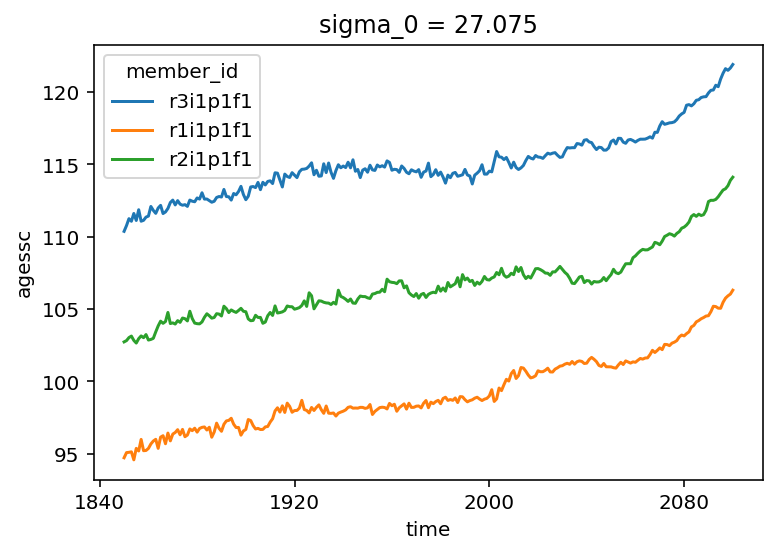

Removing file ../../data/processed/omz_timeseries/omz_timeseries_ACCESS-ESM1-5.zarr
$ Saving 7.4472e-05GB to ../../data/processed/omz_timeseries/omz_timeseries_ACCESS-ESM1-5.zarr
[########################################] | 100% Completed | 13.6s
$ Reloading file
############### CNRM-ESM2-1 ##################
$ Saving 7.4472e-05GB to ../../data/processed/omz_timeseries/omz_timeseries_CNRM-ESM2-1.zarr
[########################################] | 100% Completed | 11.7s
$ Reloading file
############### CanESM5 ##################


/scratch/gpfs2/jbusecke/conda_tigressdata/envs/aguadv_omz_busecke_2021/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


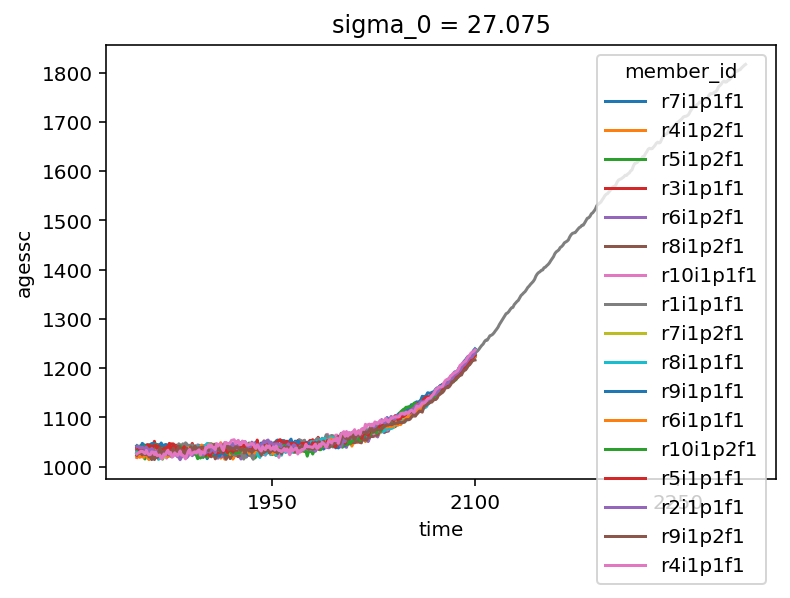

$ Saving 0.000740332GB to ../../data/processed/omz_timeseries/omz_timeseries_CanESM5.zarr
[########################################] | 100% Completed |  2min 13.0s
$ Reloading file
############### CanESM5-CanOE ##################


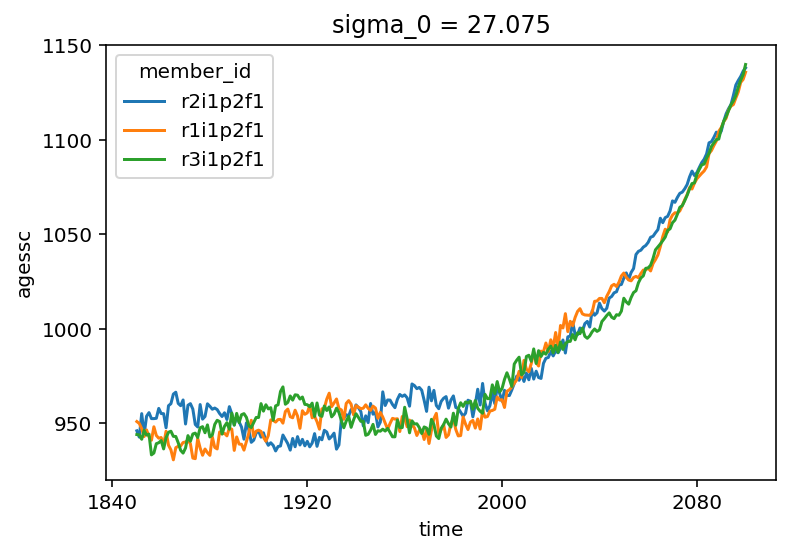

$ Saving 7.4472e-05GB to ../../data/processed/omz_timeseries/omz_timeseries_CanESM5-CanOE.zarr
[########################################] | 100% Completed | 11.7s
$ Reloading file
############### GFDL-CM4 ##################


/scratch/gpfs2/jbusecke/conda_tigressdata/envs/aguadv_omz_busecke_2021/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


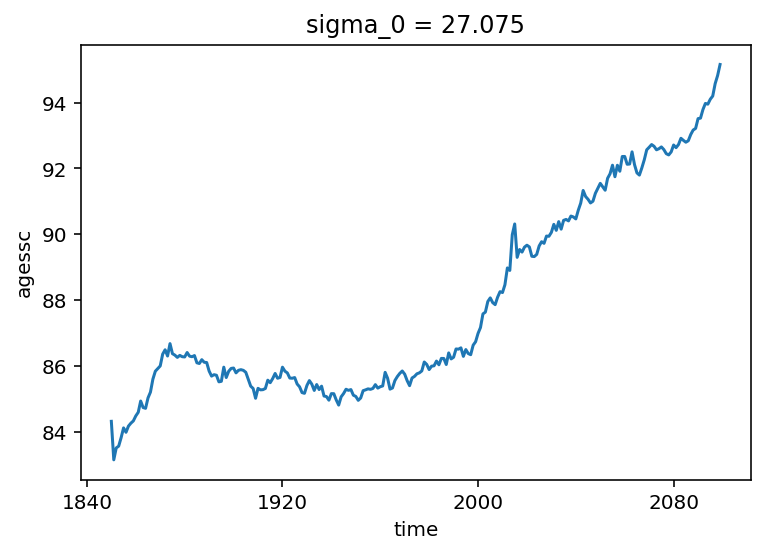

$ Saving 2.6184e-05GB to ../../data/processed/omz_timeseries/omz_timeseries_GFDL-CM4.zarr
[########################################] | 100% Completed | 12.4s
$ Reloading file
############### GFDL-ESM4 ##################


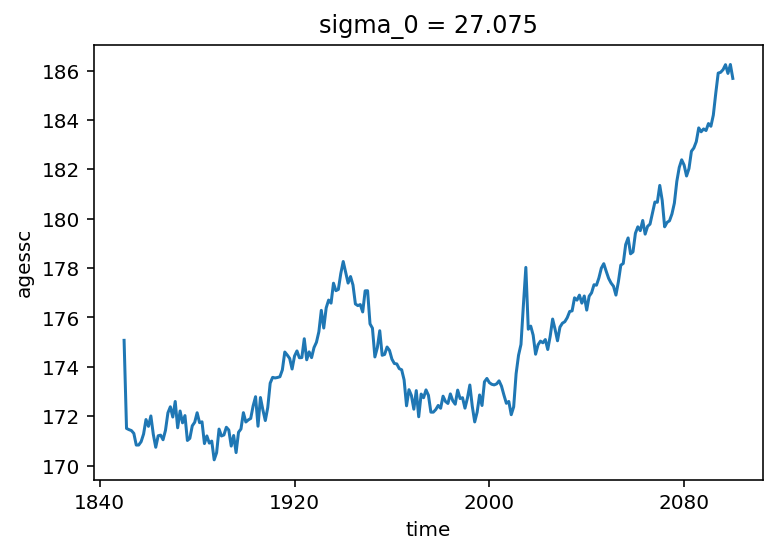

$ Saving 2.6184e-05GB to ../../data/processed/omz_timeseries/omz_timeseries_GFDL-ESM4.zarr
[########################################] | 100% Completed |  4.6s
$ Reloading file
############### IPSL-CM6A-LR ##################


/scratch/gpfs2/jbusecke/conda_tigressdata/envs/aguadv_omz_busecke_2021/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


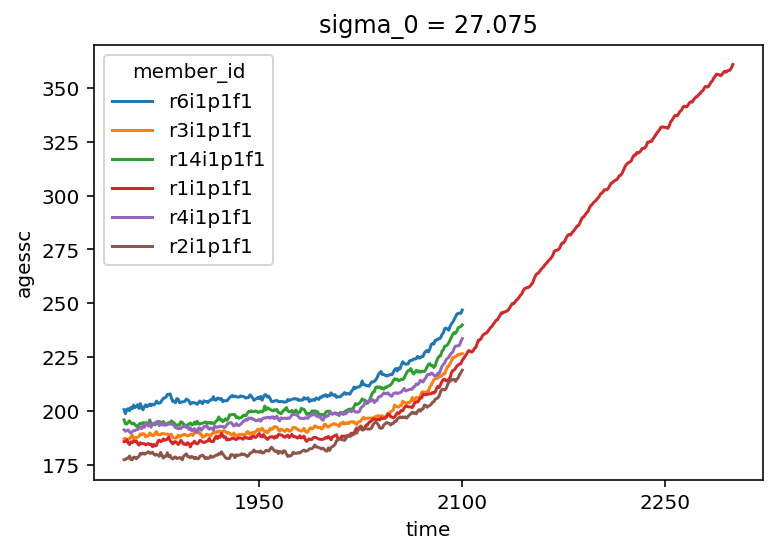

$ Saving 0.00026368GB to ../../data/processed/omz_timeseries/omz_timeseries_IPSL-CM6A-LR.zarr
[########################################] | 100% Completed | 46.6s
$ Reloading file
############### MIROC-ES2L ##################


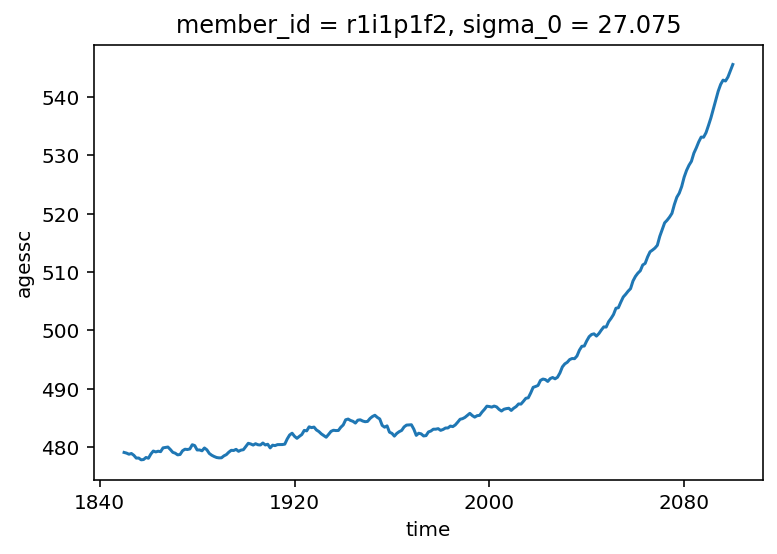

$ Saving 2.6216e-05GB to ../../data/processed/omz_timeseries/omz_timeseries_MIROC-ES2L.zarr
[########################################] | 100% Completed |  3.6s
$ Reloading file
############### MPI-ESM-1-2-HAM ##################
############### MPI-ESM1-2-HR ##################


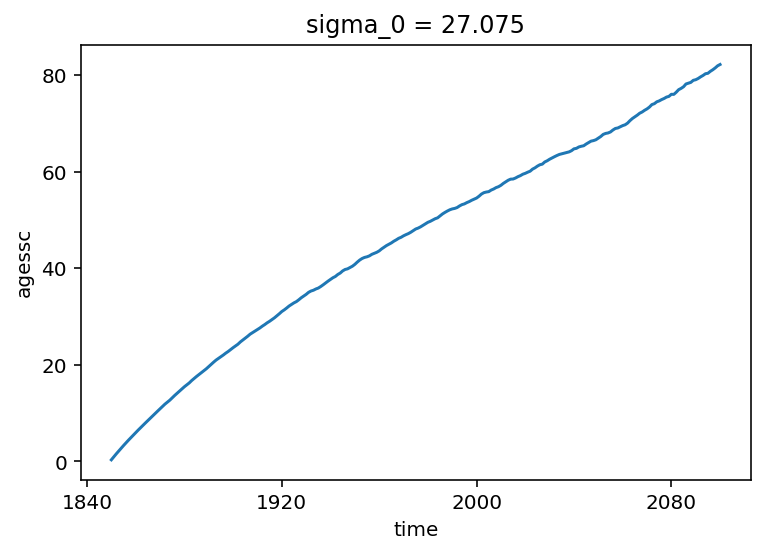





!!!!!! Age partially removed for MPI-ESM1-2-HR!!!!!!!!!!!






!!!!!! Age completely removed for MPI-ESM1-2-HR!!!!!!!!!!!


$ Saving 2.6184e-05GB to ../../data/processed/omz_timeseries/omz_timeseries_MPI-ESM1-2-HR.zarr
[########################################] | 100% Completed |  3.8s
$ Reloading file
############### MPI-ESM1-2-LR ##################


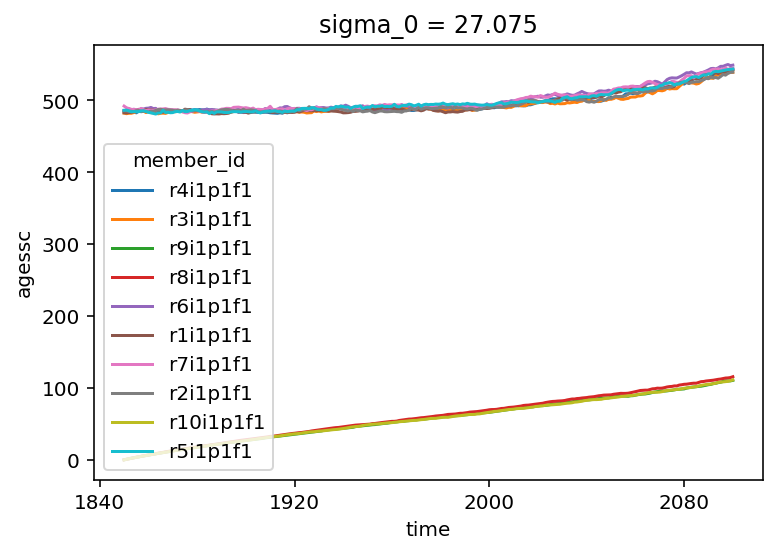





!!!!!! Age partially removed for MPI-ESM1-2-LR!!!!!!!!!!!


$ Saving 0.000243408GB to ../../data/processed/omz_timeseries/omz_timeseries_MPI-ESM1-2-LR.zarr
[########################################] | 100% Completed | 16.6s
$ Reloading file
############### MRI-ESM2-0 ##################


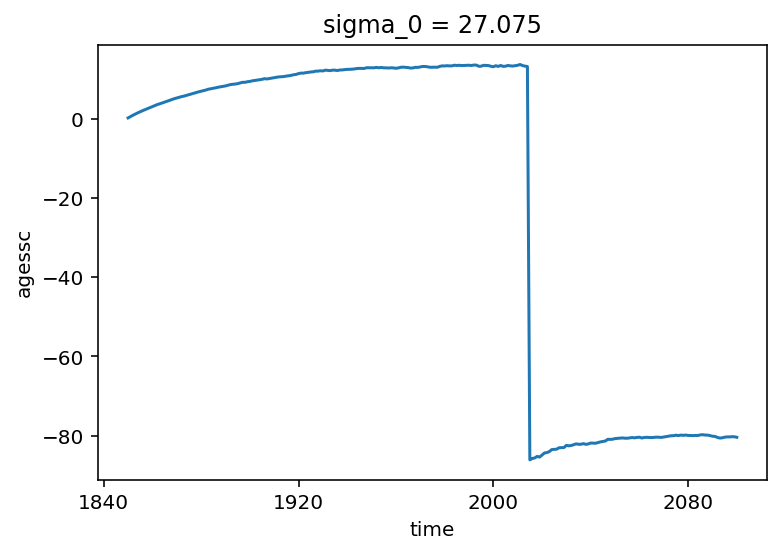





!!!!!! Age partially removed for MRI-ESM2-0!!!!!!!!!!!






!!!!!! Age completely removed for MRI-ESM2-0!!!!!!!!!!!


$ Saving 5.028e-05GB to ../../data/processed/omz_timeseries/omz_timeseries_MRI-ESM2-0.zarr
[########################################] | 100% Completed |  3.4s
$ Reloading file
############### NorESM2-LM ##################


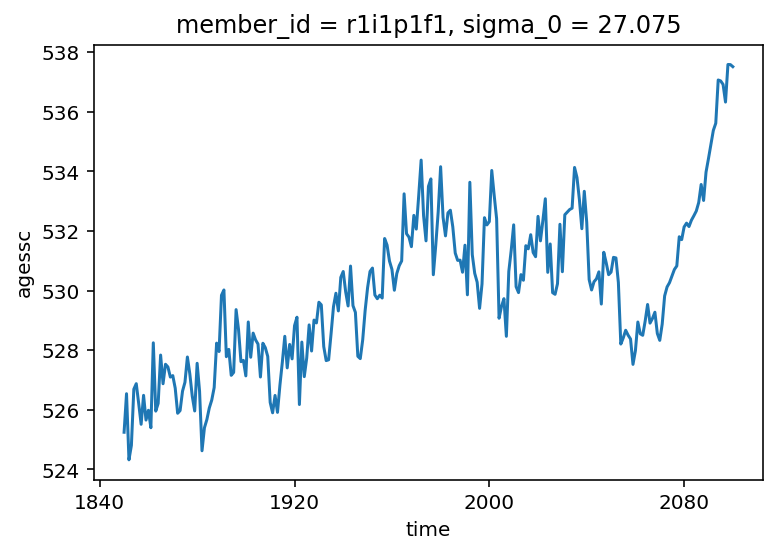

$ Saving 5.0312e-05GB to ../../data/processed/omz_timeseries/omz_timeseries_NorESM2-LM.zarr
[########################################] | 100% Completed |  3.8s
$ Reloading file
############### NorESM2-MM ##################


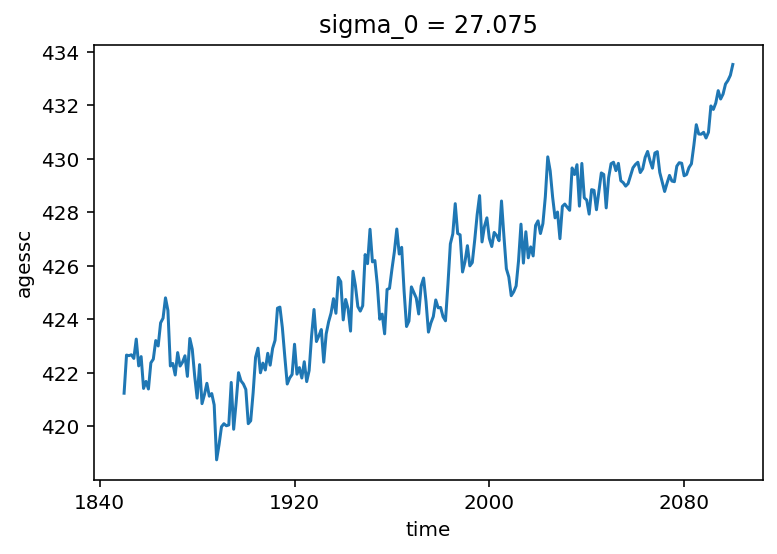

$ Saving 5.028e-05GB to ../../data/processed/omz_timeseries/omz_timeseries_NorESM2-MM.zarr
[########################################] | 100% Completed |  3.6s
$ Reloading file
############### UKESM1-0-LL ##################


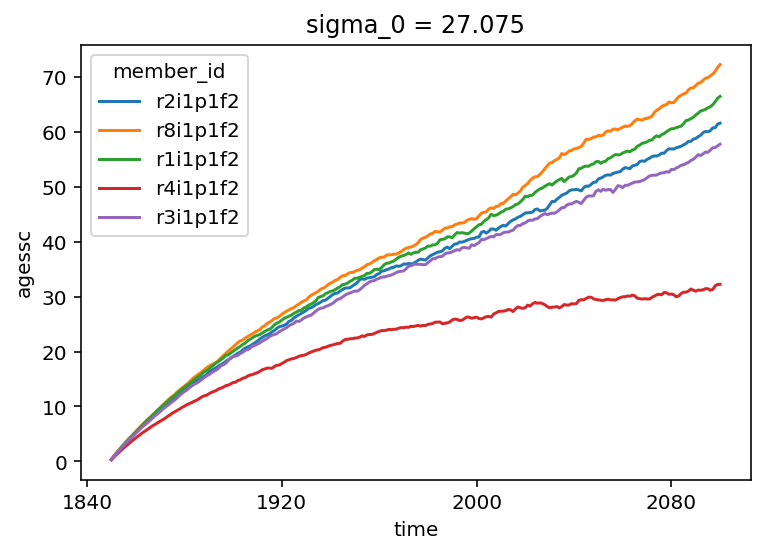





!!!!!! Age partially removed for UKESM1-0-LL!!!!!!!!!!!






!!!!!! Age completely removed for UKESM1-0-LL!!!!!!!!!!!


$ Saving 0.000122728GB to ../../data/processed/omz_timeseries/omz_timeseries_UKESM1-0-LL.zarr
[########################################] | 100% Completed | 17.7s
$ Reloading file


In [11]:
# ofolder = maybe_create_folder("../../data/processed/full_output/")
ofolder_timeseries = maybe_create_folder("../../data/processed/omz_timeseries/")

ddict_full = {}
for si in source_ids:
    print(f"############### {si} ##################")
    hist = ddict_merged[si].get("historical", None)
    cc = ddict_merged[si].get("ssp585", None)
    if hist is not None and cc is not None:
        ds = xr.concat([hist, cc], dim="time", join="inner")
        
        # QC for age. Remove fields with starting vaalues around 0
        if 'agessc' in ds.variables:
            plt.figure()
            ds.agessc.isel(sigma_0=2).mean(['x','y']).plot(hue='member_id')
            plt.show()
            remove_idx = ds['agessc'].isel(sigma_0=1,time=0).mean(['x','y']).squeeze()>2
            if np.sum(~remove_idx).data > 0:
                print(f'\n\n\n\n!!!!!! Age partially removed for {si}!!!!!!!!!!!\n\n')
                
            ds['agessc'] = ds['agessc'].where(remove_idx)
            if np.isnan(ds['agessc'].isel(time=slice(0,10))).all():
                ds = ds.drop(['agessc'])
                print(f'\n\n\n\n!!!!!! Age completely removed for {si}!!!!!!!!!!!\n\n')
            
            
                
        # Calculate additional variables
        ds = add_aou(ds)
    
        # precalculate our
        if 'agessc' in ds.variables:
            ds['our'] = ds['aou']/ds['agessc']
        
        # reduce region here (I think I should save the full region for posteriority)
        ds_save = region(ds, lat=40)

        # compute the integrated omz_volume
        ds_save["omz_volume"] = omz_volume(region(ds, lat=30)) # should probably add some metadata about the region in `omz_volume`
        
        ds_save = ds_save.chunk({'time':2})

        
        with ProgressBar():
            with warnings.catch_warnings():
                warnings.filterwarnings("ignore")

#                 filename = f"full_output_{si}.zarr"
#                 ds_reloaded = write(
#                     ds_save,
#                     ofolder.joinpath(filename),
#                     serialize_load_over_dim=False,
#                     overwrite=overwrite,
#                 )
                # write out only the timeseries
                filename = f"omz_timeseries_{si}.zarr"
                ds_reloaded = write(
                    ds_save[['omz_volume']],
                    ofolder_timeseries.joinpath(filename),
                    serialize_load_over_dim=False,
                    overwrite=overwrite,
                )

        ddict_full[si] = ds

## Save out trends

ACCESS-ESM1-5
File [../../data/processed/linear_trends/linear_trends_ACCESS-ESM1-5.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

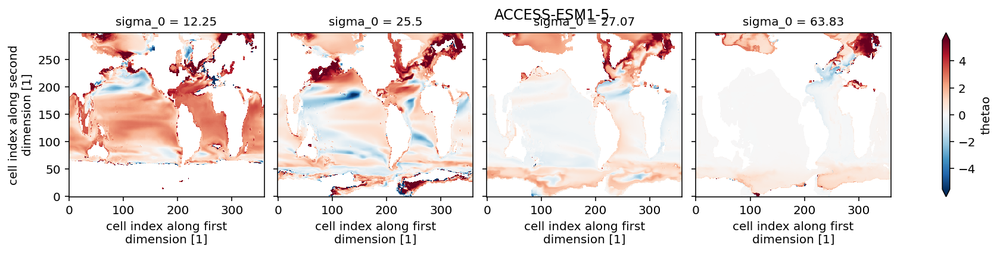

<Figure size 432x288 with 0 Axes>

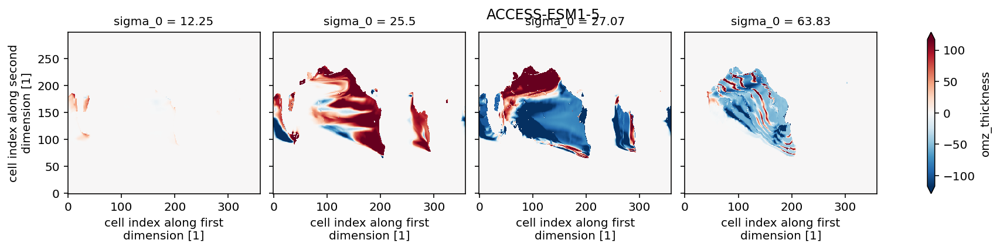

CNRM-ESM2-1
File [../../data/processed/linear_trends/linear_trends_CNRM-ESM2-1.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

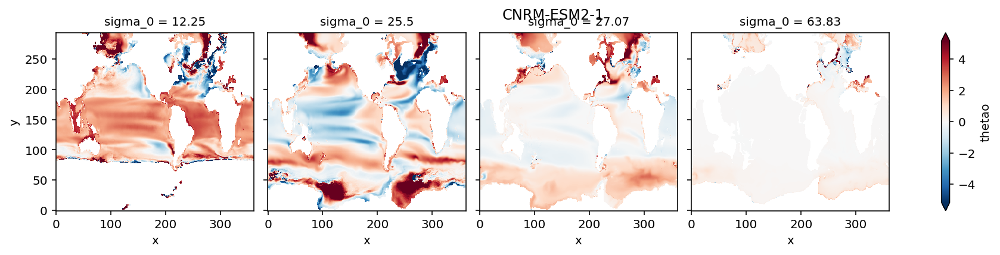

<Figure size 432x288 with 0 Axes>

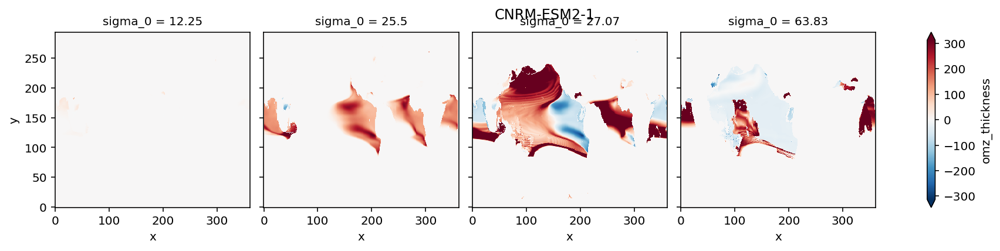

CanESM5
File [../../data/processed/linear_trends/linear_trends_CanESM5.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

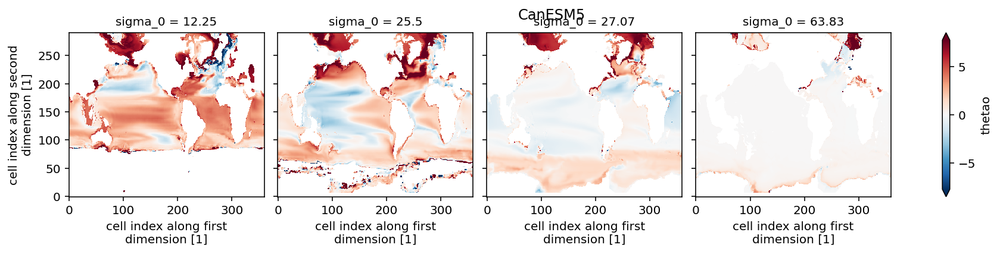

<Figure size 432x288 with 0 Axes>

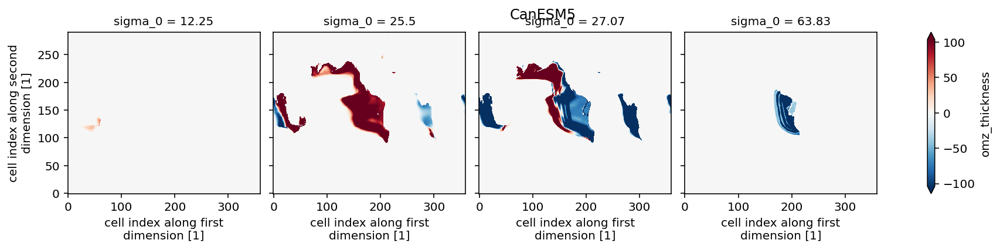

CanESM5-CanOE
File [../../data/processed/linear_trends/linear_trends_CanESM5-CanOE.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

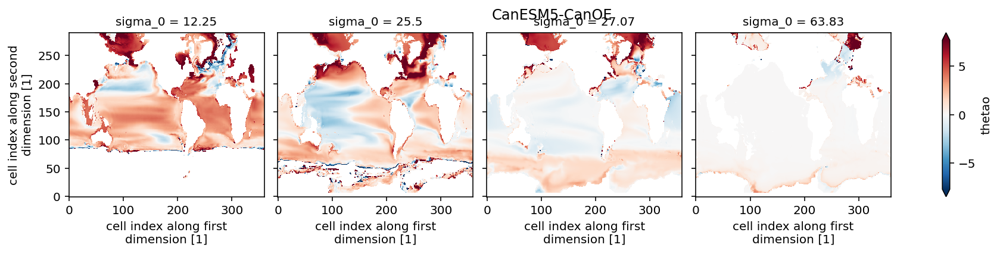

<Figure size 432x288 with 0 Axes>

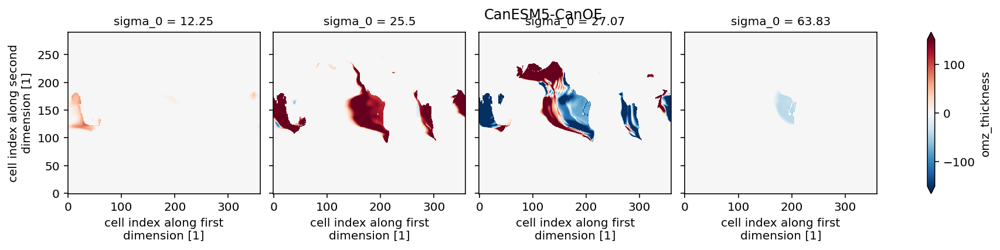

GFDL-CM4
File [../../data/processed/linear_trends/linear_trends_GFDL-CM4.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

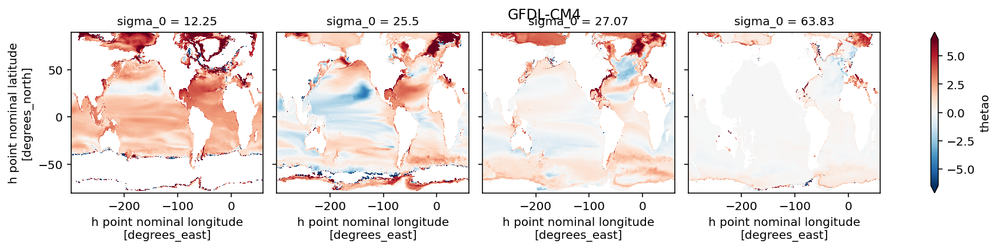

<Figure size 432x288 with 0 Axes>

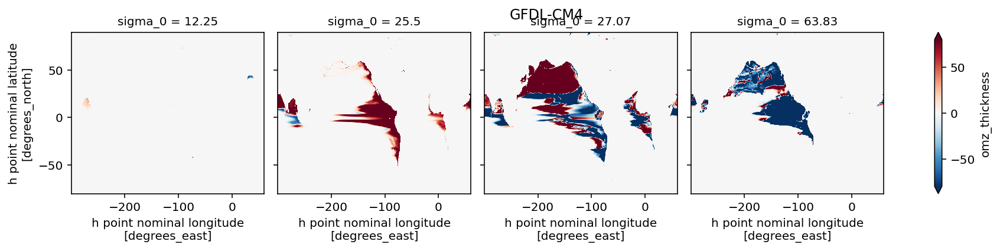

GFDL-ESM4
File [../../data/processed/linear_trends/linear_trends_GFDL-ESM4.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

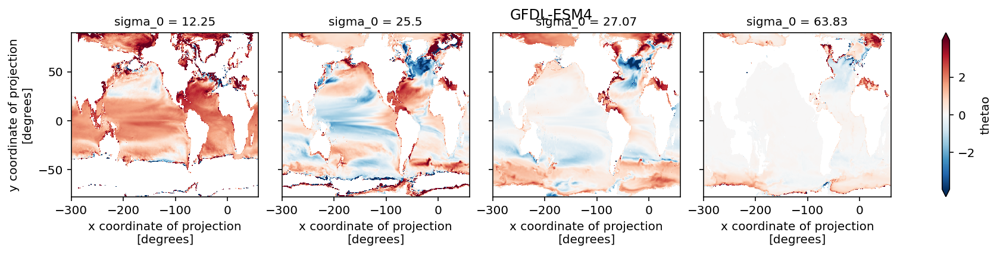

<Figure size 432x288 with 0 Axes>

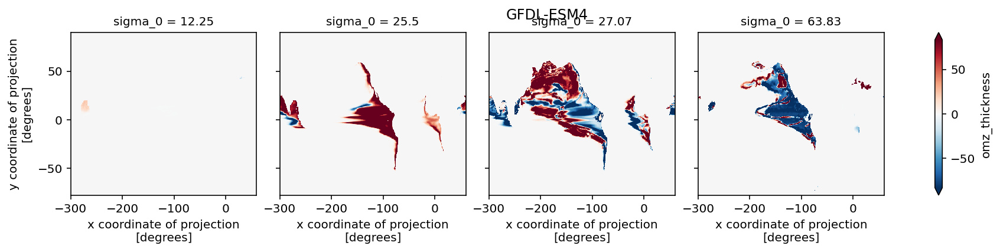

IPSL-CM6A-LR
File [../../data/processed/linear_trends/linear_trends_IPSL-CM6A-LR.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

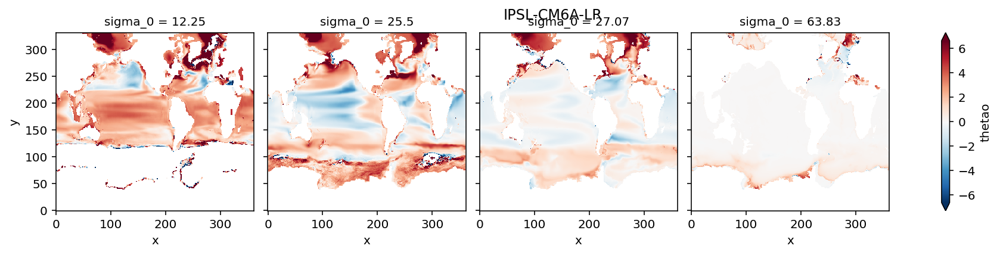

<Figure size 432x288 with 0 Axes>

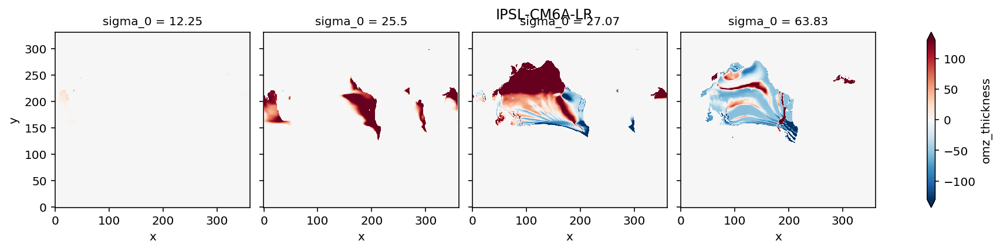

MIROC-ES2L
File [../../data/processed/linear_trends/linear_trends_MIROC-ES2L.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

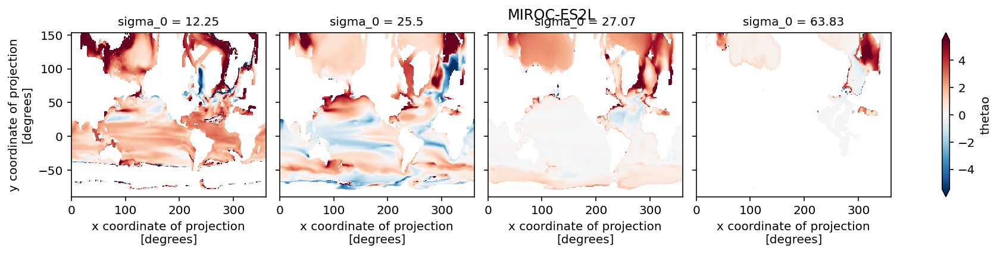

<Figure size 432x288 with 0 Axes>

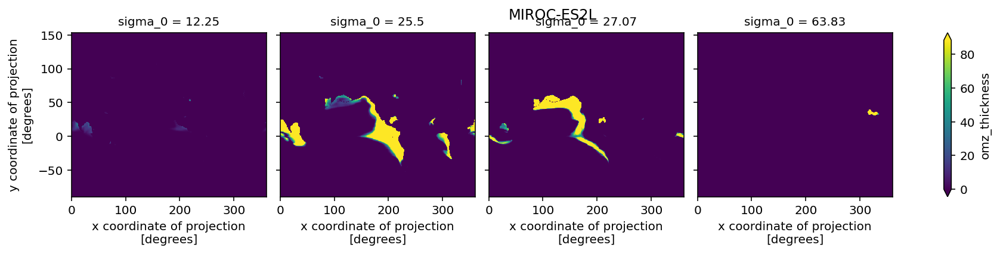

MPI-ESM1-2-HR
File [../../data/processed/linear_trends/linear_trends_MPI-ESM1-2-HR.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

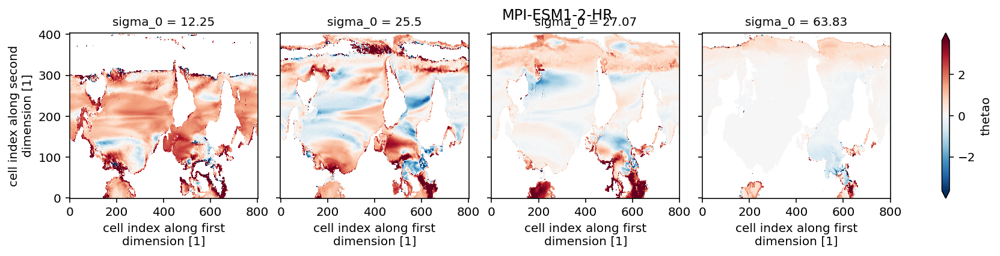

<Figure size 432x288 with 0 Axes>

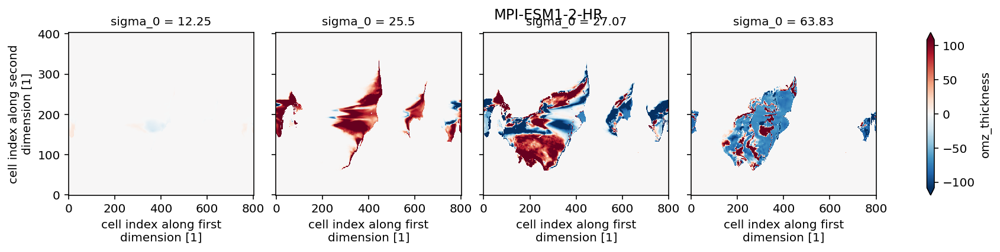

MPI-ESM1-2-LR
File [../../data/processed/linear_trends/linear_trends_MPI-ESM1-2-LR.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

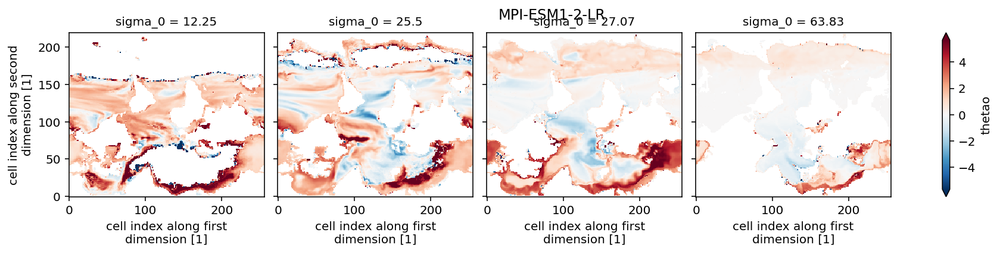

<Figure size 432x288 with 0 Axes>

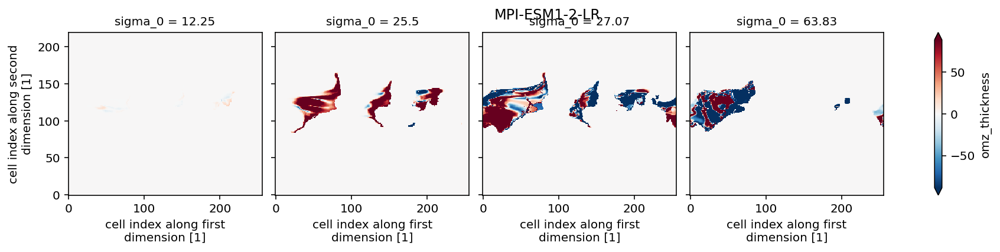

MRI-ESM2-0
File [../../data/processed/linear_trends/linear_trends_MRI-ESM2-0.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

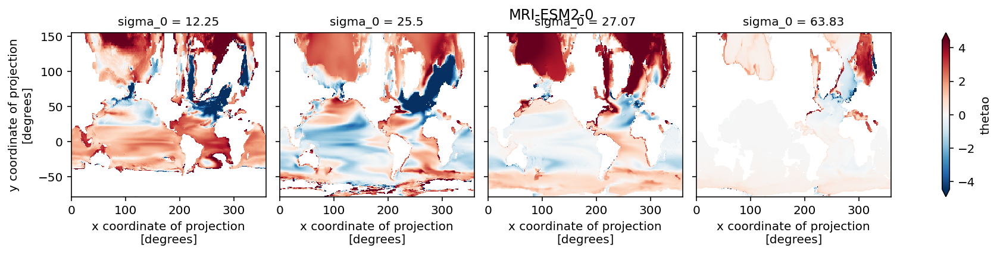

<Figure size 432x288 with 0 Axes>

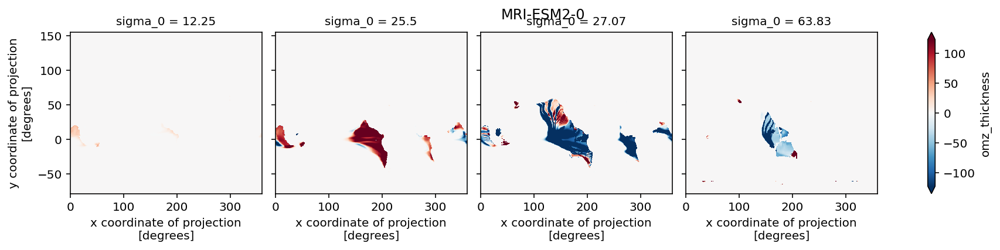

NorESM2-LM
File [../../data/processed/linear_trends/linear_trends_NorESM2-LM.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

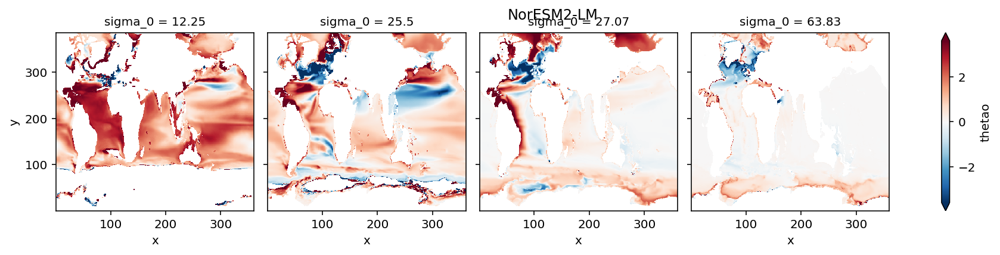

<Figure size 432x288 with 0 Axes>

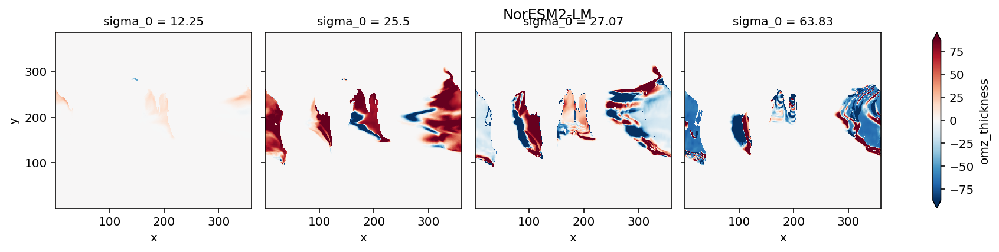

NorESM2-MM
File [../../data/processed/linear_trends/linear_trends_NorESM2-MM.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

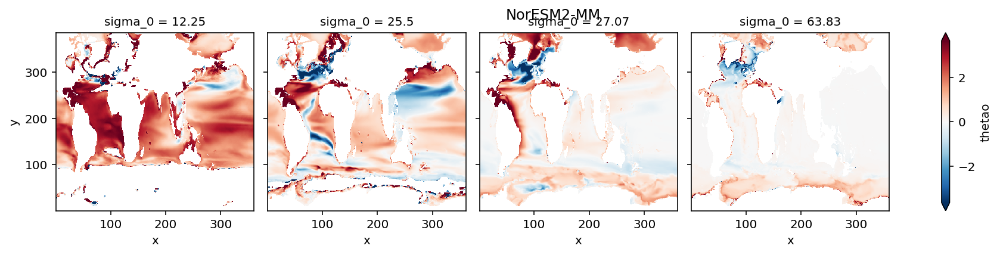

<Figure size 432x288 with 0 Axes>

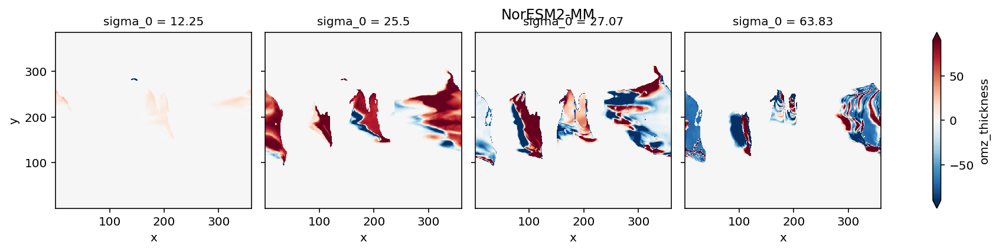

UKESM1-0-LL
File [../../data/processed/linear_trends/linear_trends_UKESM1-0-LL.zarr] already exists. Skipping.


<Figure size 432x288 with 0 Axes>

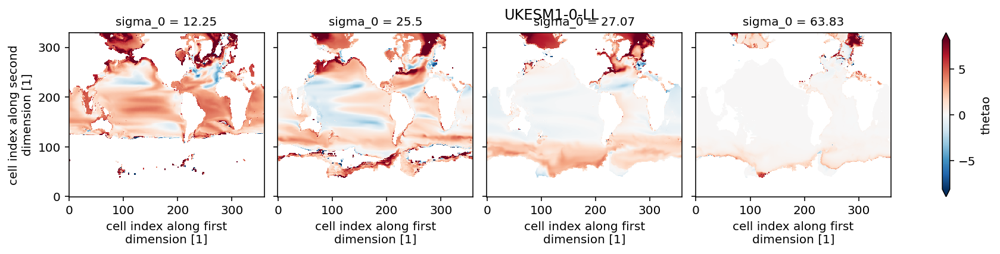

<Figure size 432x288 with 0 Axes>

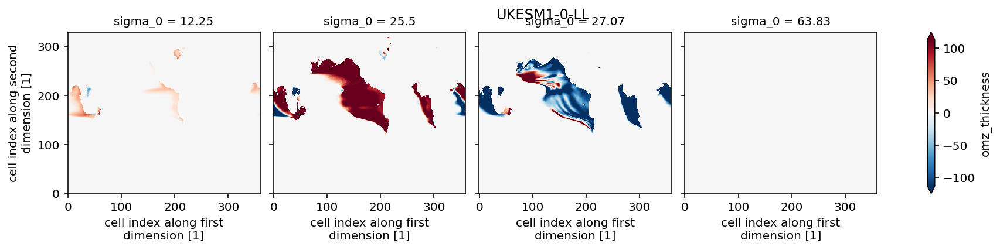

In [9]:
ofolder = maybe_create_folder("../../data/processed/linear_trends/")
def output_trends(ds, dim="time"):
    
    member = ds.member_id

    # compute the integrated omz_volume
    ds["omz_volume"] = omz_volume(region(ds, lat=30))

    #
    ds = ds.sel(time=slice("2000", "2100"))
    trend_bounds = [str(ds.time.data[0]), str(ds.time.data[-1])]
    
    trend_ds = xr.Dataset()
    for var in ds.data_vars:
        if dim in ds[var].dims:
            reg = linear_trend(ds[var], "time")
            parameters = list(reg.data_vars)
            reg = xr.concat([reg[param] for param in parameters], dim="parameter")
            reg = reg.assign_coords(parameter=parameters)
            trend_ds[var] = reg
            
    if 'member_id' not in trend_ds.dims:
        trend_ds = trend_ds.expand_dims('member_id')
        trend_ds['member_id'] = member
        # FUCKING SHITSTAIN. Can I just keep the member_id?
    trend_ds.attrs = ds.attrs
    trend_ds.attrs["trend_time_bounds"] = trend_bounds
    return trend_ds


ddict_trend = {}
for k, ds in ddict_full.items():
    print(k)
    if 'member_id' not in ds.dims:
        ds = ds.expand_dims('member_id')
    ds_trend = output_trends(ds)
    with ProgressBar():
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore")

            filename = f"linear_trends_{k}.zarr"
            ds_trend_reloaded = write(
                ds_trend,
                ofolder.joinpath(filename),
                serialize_load_over_dim=False,
                overwrite=overwrite,
            )
    ddict_trend[k] = ds_trend_reloaded
        
    # some test plots
    plt.figure()
    (ds_trend_reloaded.thetao * 100).sel(parameter="slope").isel(
        member_id=0, missing_dims="ignore"
    ).plot(col="sigma_0", robust=True)
    plt.suptitle(k)

    plt.figure()
    (ds_trend_reloaded.omz_thickness * 100).sel(o2_bin=80, parameter="slope").isel(
        member_id=0, missing_dims="ignore"
    ).plot(col="sigma_0", robust=True)
    plt.suptitle(k)
    plt.show()

## Regrid historical depth data (for section plot only)


In [37]:
def regrid_dict_to_dataset(d_dict):
    datasets = []
    progress = progress_bar(d_dict.items())
    for model, ds in progress:
        ds = ds.assign_coords(model=model)
        if "time" in ds.dims:
            ds = replace_time(
                ds, ref_date=ds.time.data[0], calendar="standard", freq="1AS"
            )
        # For this one I think its better to average the members
        averaged_members = []
        if "member_id" in ds.variables:
            averaged_members = ds["member_id"].data
            ds = ds.mean("member_id")

        # this should actually be integrated in the funtion (I think it is in regrid_like)
        # Also this can probably be solved by fixing the cf attrs on lon verticies
        # for now quick fix
        ds = ds.drop(
            [
                co
                for co in ["lon_verticies", "lat_verticies", "x", "y"]
                if co in ds.variables
            ]
        )
        ds = ds.chunk({"x": -1, "y": -1})

        # reset some coordinates
        if "dz_t" in ds.variables:
            ds = ds.reset_coords(["dz_t"])

        ds_regridded = regrid_horizontal(ds, 0.25, 0.25, ignore_degenerate=True)
        # it drops the omz_volume for now, but I think that is ok?

        # plot attrs back in
        ds_regridded.attrs.update(ds.attrs)
        # This is a less then ideal solution, but hey...

        ds_regridded = ds_regridded.assign_coords(
            averaged_members=[str(averaged_members)]
        )
        for co in ["sigma_0_bounds"]:
            if co in ds.variables:
                ds_regridded = ds_regridded.assign_coords({co: ds[co]})

        if "dz_t" in ds_regridded.variables:
            ds_regridded = ds_regridded.set_coords(["dz_t"])

        datasets.append(ds_regridded)

        # give nan for age...
        for nan_var in ["agessc", "our"]:
            if nan_var not in ds_regridded.data_vars:
                ds_regridded[nan_var] = xr.ones_like(ds_regridded.o2) * np.nan

    return xr.concat(datasets, dim="model")
    return datasets

## save out regridded member averaged fields (region only)

In [11]:
with warnings.catch_warnings():
    warnings.filterwarnings("ignore")
    ds_full_sigma = regrid_dict_to_dataset(ddict_full)

    ds_trend_sigma = regrid_dict_to_dataset(ddict_trend)

KeyboardInterrupt: 

In [ ]:
ofolder = ofolder = maybe_create_folder(
    "../../data/processed/regridded_multimodel_output/"
)

with ProgressBar():
    # save only the historical average for the region
    ds_historical_regridded_sigma = region(
        ds_full_sigma.sel(time=slice("1960", "2000")).reset_coords('dz_t').mean("time").set_coords('dz_t'), lat=40
    )
    
    assert 'dz_t' in ds_historical_regridded_sigma.variables
    
    filename = "historical_regridded_sigma.zarr"
    write(
        ds_historical_regridded_sigma,
        ofolder.joinpath(filename),
        serialize_load_over_dim=False,
        overwrite=overwrite,
    )

    ds_trend_regridded_sigma = region(ds_trend_sigma, lat=40)
    filename = "trend_regridded_sigma.zarr"
    write(
        ds_trend_regridded_sigma,
        ofolder.joinpath(filename),
        serialize_load_over_dim=False,
        overwrite=overwrite,
    )

## Quantify Control variability
The idea here would be to detrend the thing and just do a simple stdv over time (and then average that over members if applicable)

Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_ACCESS-ESM1-5.nc
$ Start loading
[########################################] | 100% Completed |  6.6s
$ Saving 6.0272e-05GB to ../../data/processed/omz_natural_variability/omz_natural_variability_ACCESS-ESM1-5.nc
$ Reloading file


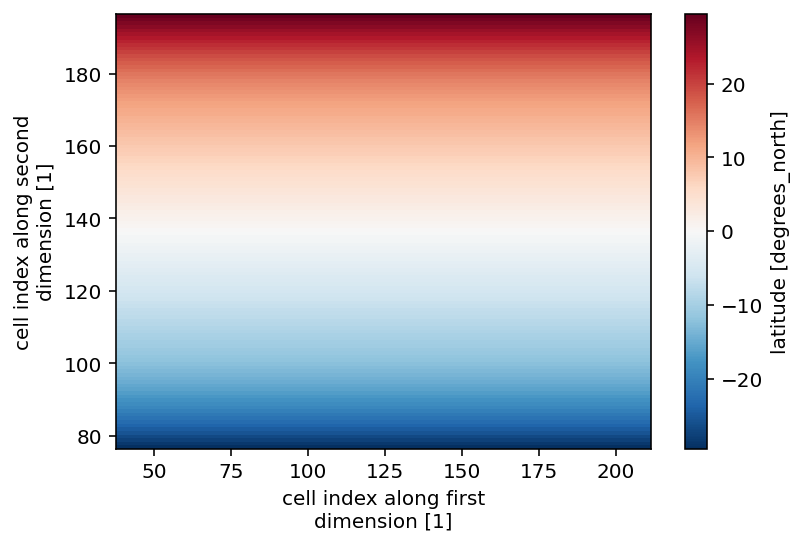

<Figure size 432x288 with 0 Axes>

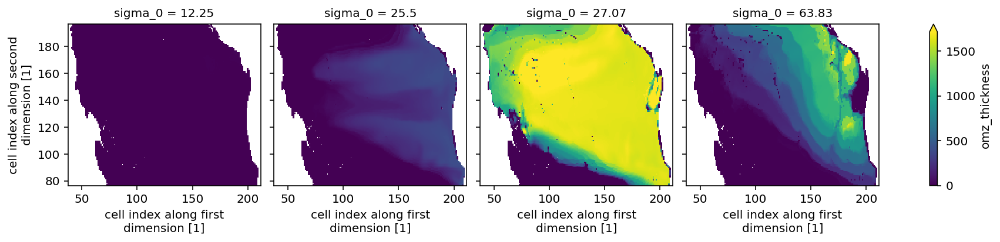

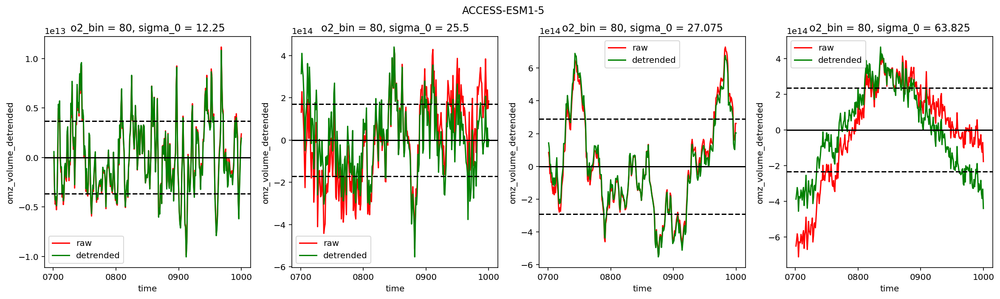

Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_CNRM-ESM2-1.nc
$ Start loading
[########################################] | 100% Completed |  6.7s
$ Saving 6.0272e-05GB to ../../data/processed/omz_natural_variability/omz_natural_variability_CNRM-ESM2-1.nc
$ Reloading file


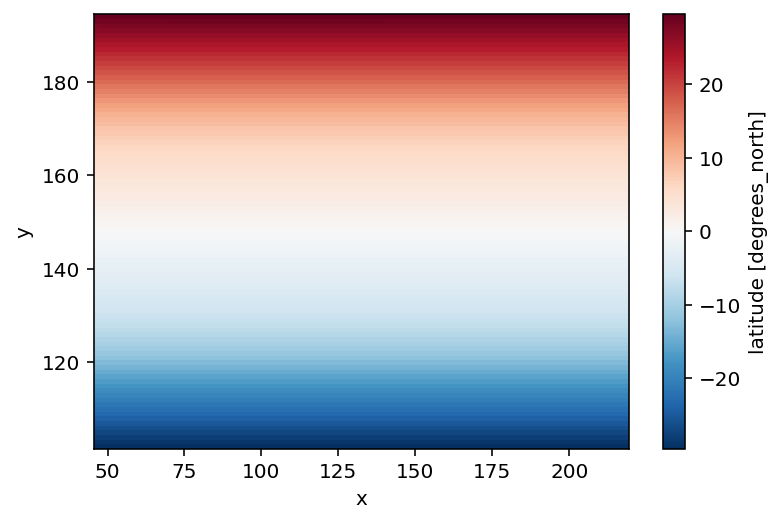

<Figure size 432x288 with 0 Axes>

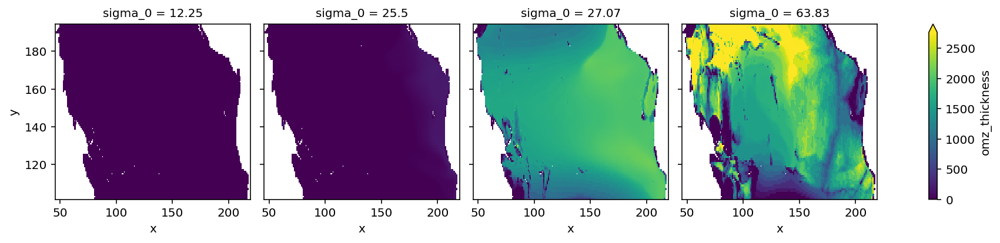

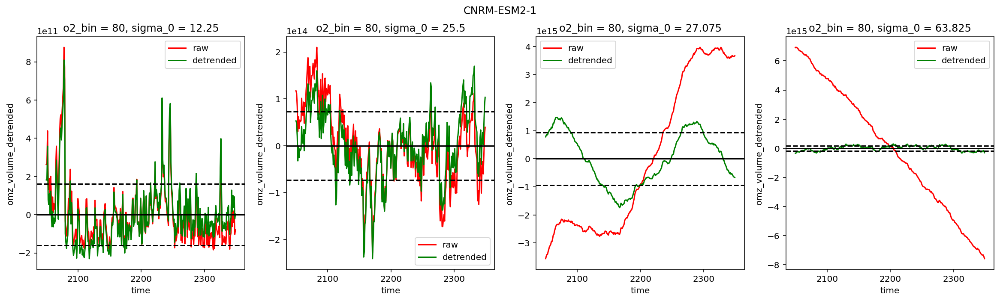

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/core.py:4143: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


$ Start loading
[#############                           ] | 34% Completed | 11.4s

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


[##############                          ] | 35% Completed | 11.8s

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


[########################################] | 100% Completed | 30.1s
$ Saving 0.00023568GB to ../../data/processed/omz_natural_variability/omz_natural_variability_CanESM5.nc
$ Reloading file


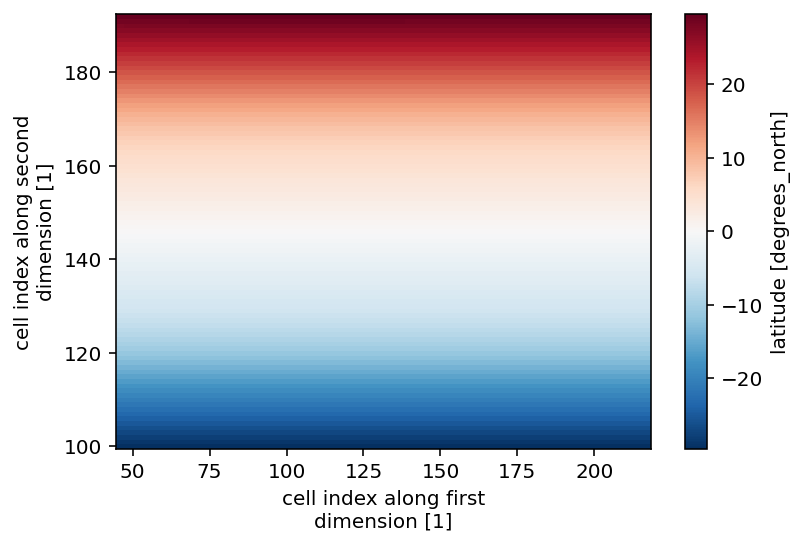

<Figure size 432x288 with 0 Axes>

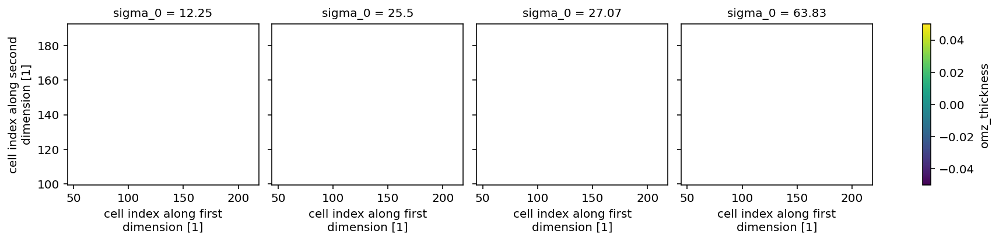

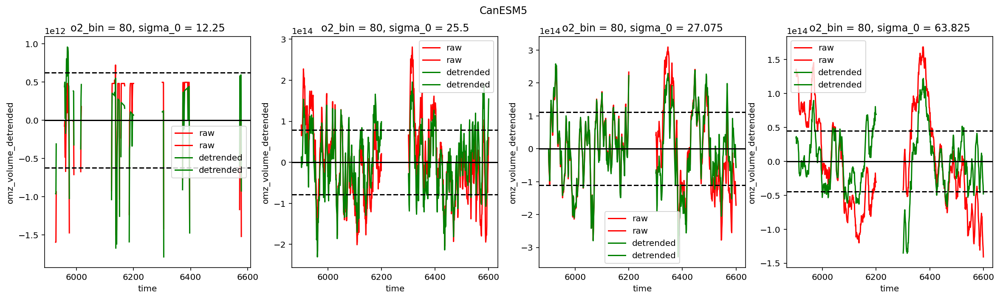

Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_CanESM5-CanOE.nc
$ Start loading
[#############                           ] | 34% Completed |  2.9s

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


[################                        ] | 40% Completed |  3.3s

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


[########################################] | 100% Completed |  6.6s
$ Saving 6.0272e-05GB to ../../data/processed/omz_natural_variability/omz_natural_variability_CanESM5-CanOE.nc
$ Reloading file


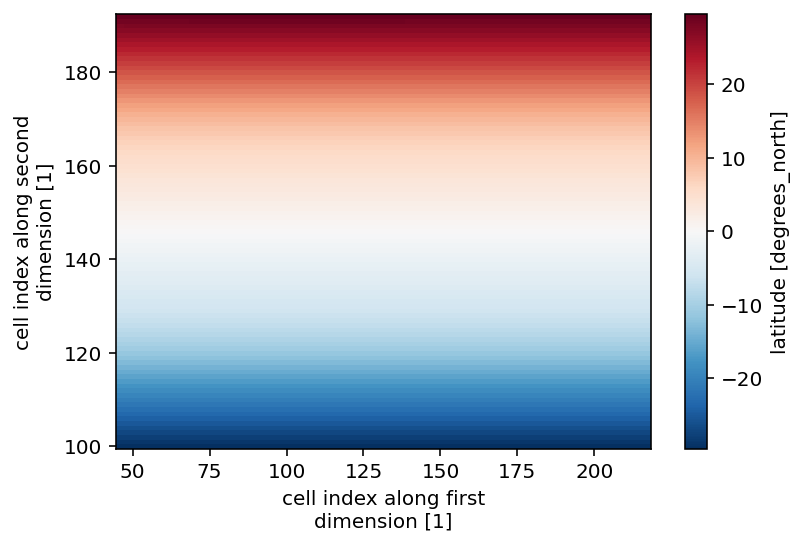

<Figure size 432x288 with 0 Axes>

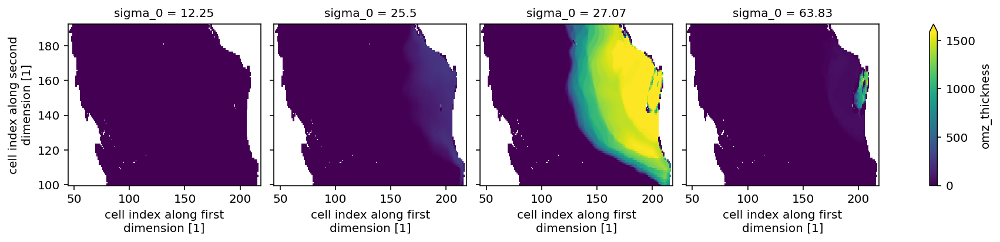

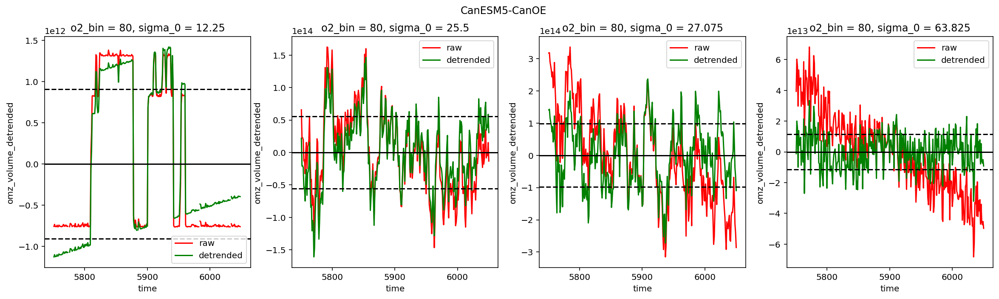

Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_GFDL-CM4.nc
$ Start loading
[########################################] | 100% Completed | 12.0s
$ Saving 6.0272e-05GB to ../../data/processed/omz_natural_variability/omz_natural_variability_GFDL-CM4.nc
$ Reloading file


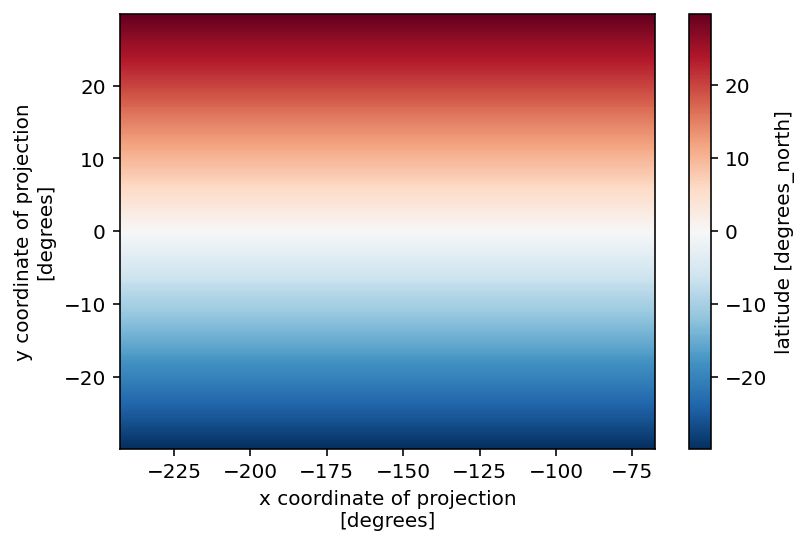

<Figure size 432x288 with 0 Axes>

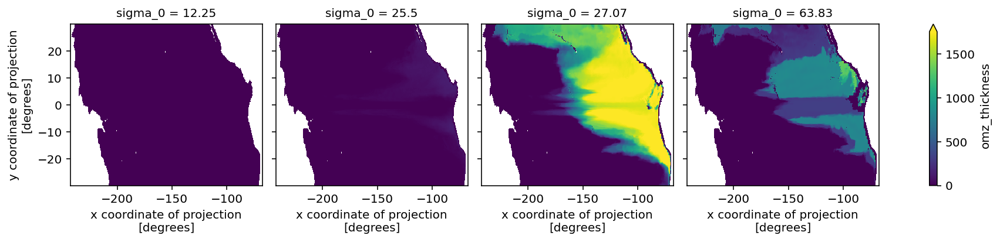

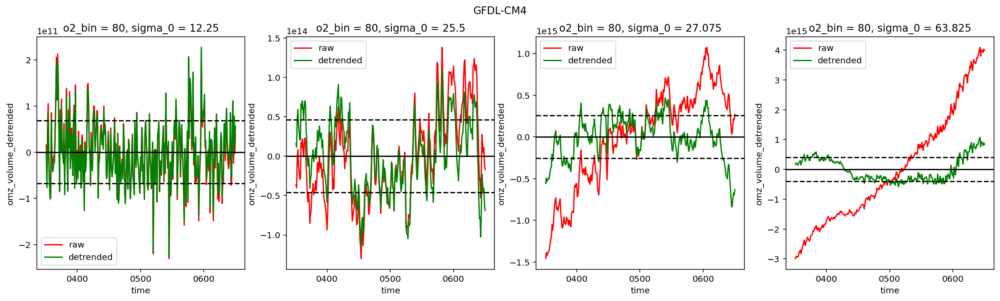

Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_GFDL-ESM4.nc
$ Start loading
[#############                           ] | 34% Completed |  2.6s

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


[################                        ] | 40% Completed |  2.9s

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


[########################################] | 100% Completed |  7.0s
$ Saving 6.0272e-05GB to ../../data/processed/omz_natural_variability/omz_natural_variability_GFDL-ESM4.nc
$ Reloading file


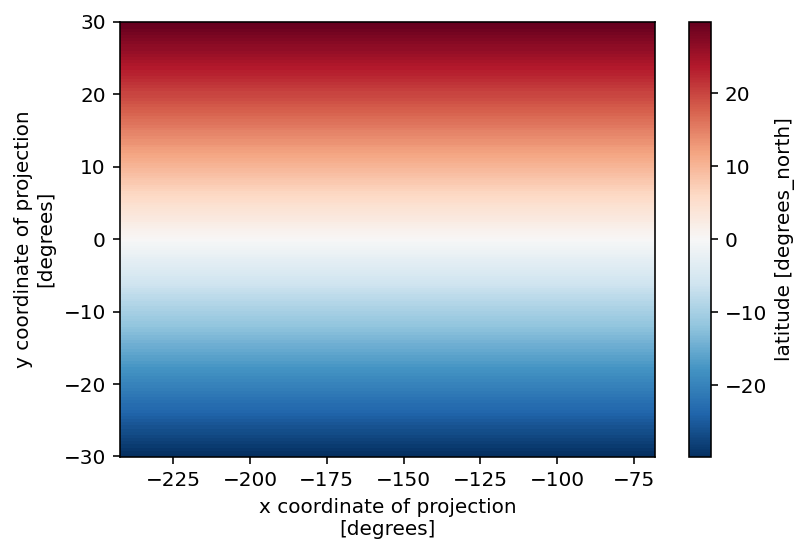

<Figure size 432x288 with 0 Axes>

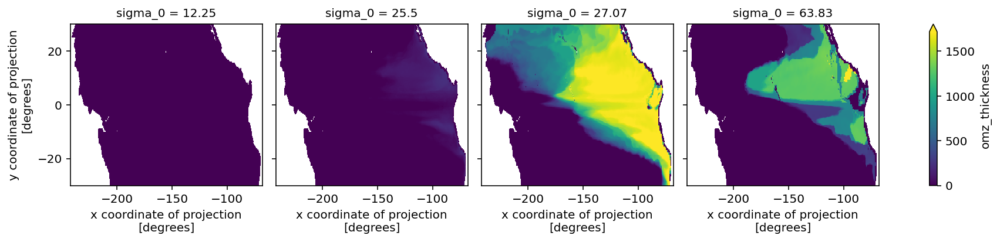

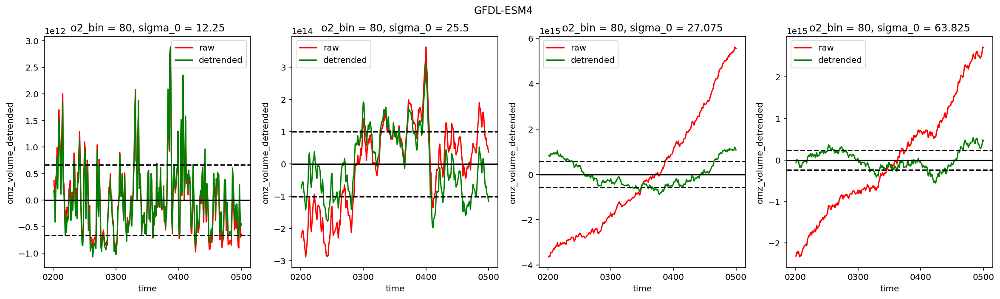

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/core.py:4143: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_IPSL-CM6A-LR.nc
$ Start loading
[####                                    ] | 10% Completed |  4.3s

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


[####                                    ] | 12% Completed |  4.8s

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


[########################################] | 100% Completed | 27.3s
$ Saving 0.00021608GB to ../../data/processed/omz_natural_variability/omz_natural_variability_IPSL-CM6A-LR.nc
$ Reloading file


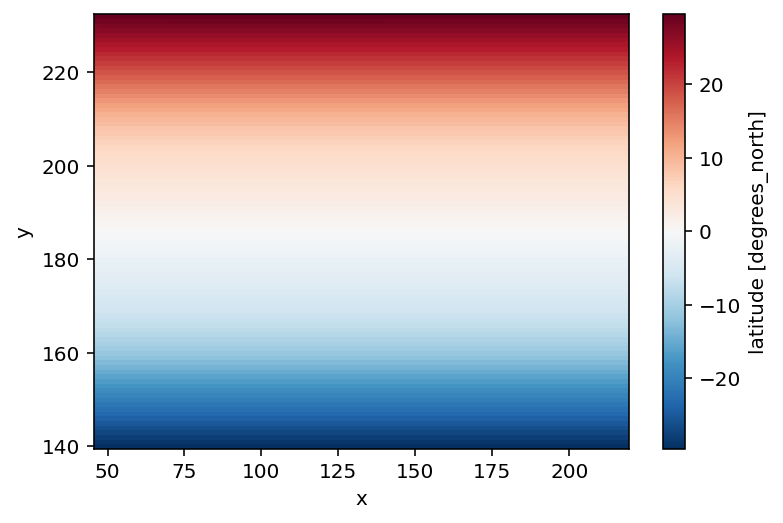

<Figure size 432x288 with 0 Axes>

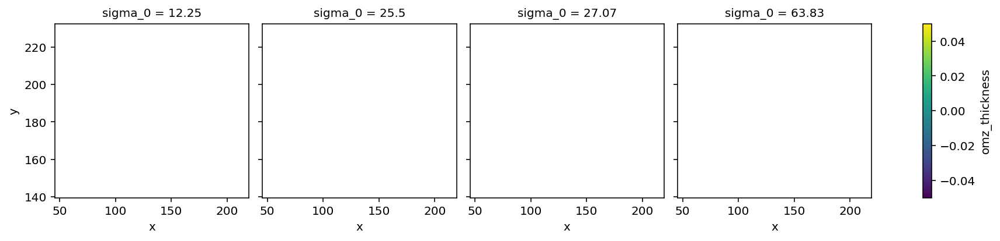

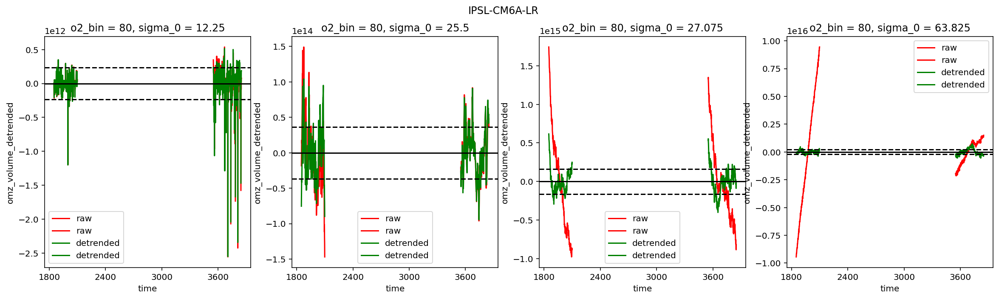

Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_MIROC-ES2L.nc
$ Start loading
[#######                                 ] | 18% Completed |  1.2s

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


[#########                               ] | 24% Completed |  1.5s

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


[########################################] | 100% Completed |  7.5s
$ Saving 6.0272e-05GB to ../../data/processed/omz_natural_variability/omz_natural_variability_MIROC-ES2L.nc
$ Reloading file


/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


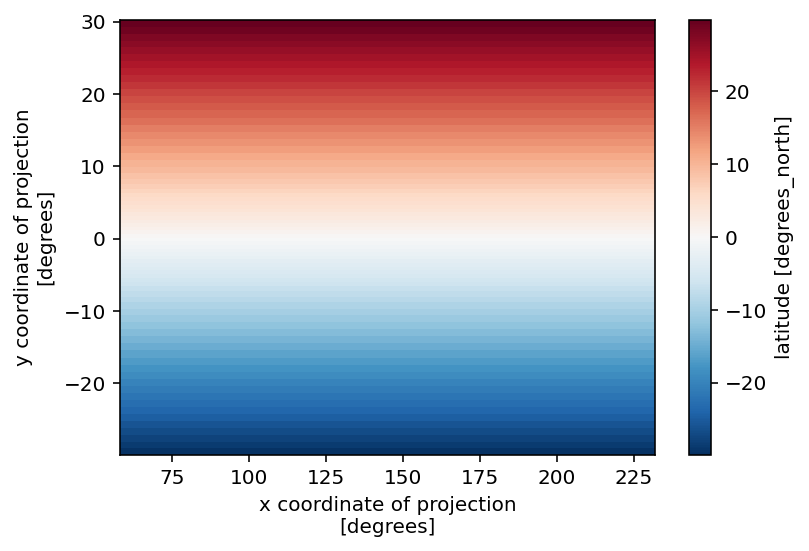

<Figure size 432x288 with 0 Axes>

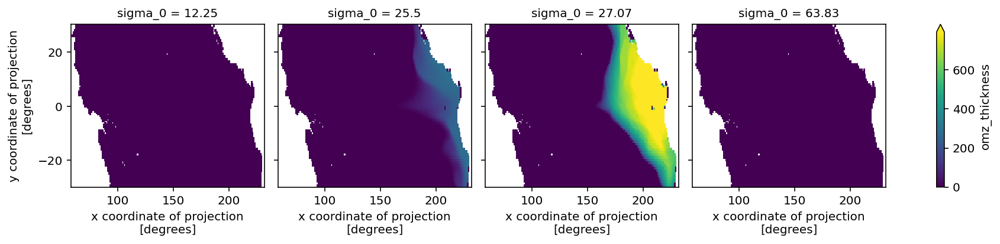

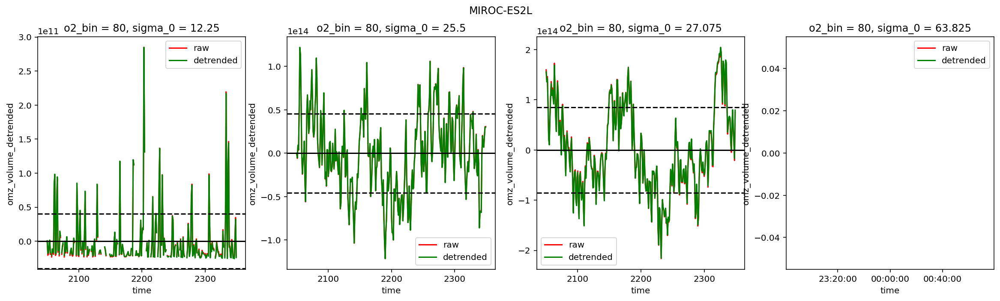

Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_MPI-ESM-1-2-HAM.nc
$ Start loading
[########################################] | 100% Completed |  6.9s
$ Saving 6.0272e-05GB to ../../data/processed/omz_natural_variability/omz_natural_variability_MPI-ESM-1-2-HAM.nc
$ Reloading file


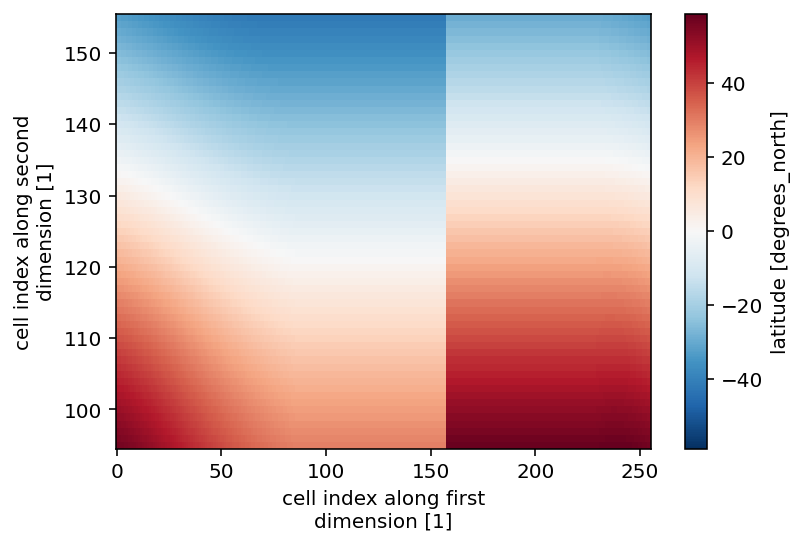

<Figure size 432x288 with 0 Axes>

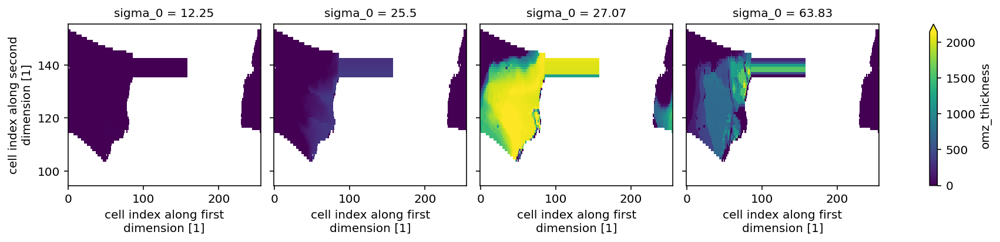

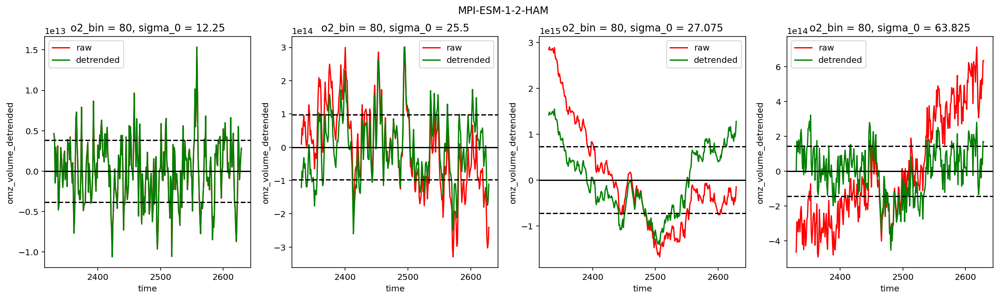

Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_MPI-ESM1-2-HR.nc
$ Start loading
[########################################] | 100% Completed |  6.3s
$ Saving 6.0272e-05GB to ../../data/processed/omz_natural_variability/omz_natural_variability_MPI-ESM1-2-HR.nc
$ Reloading file


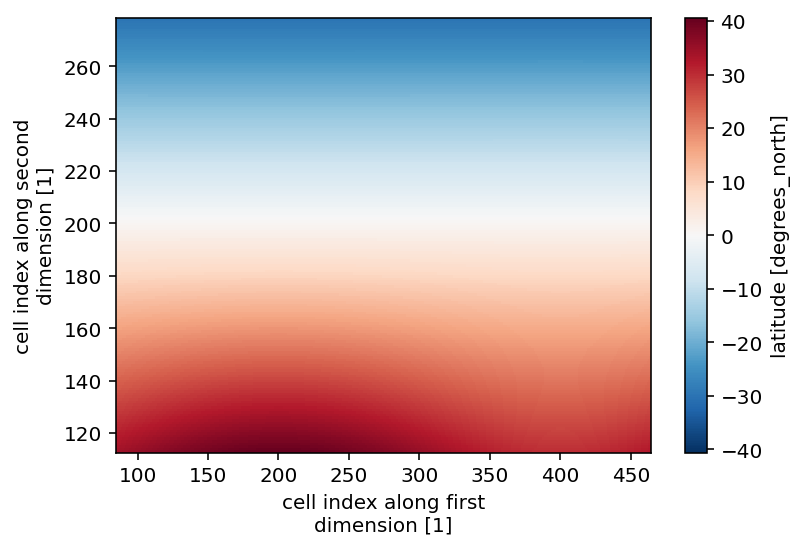

<Figure size 432x288 with 0 Axes>

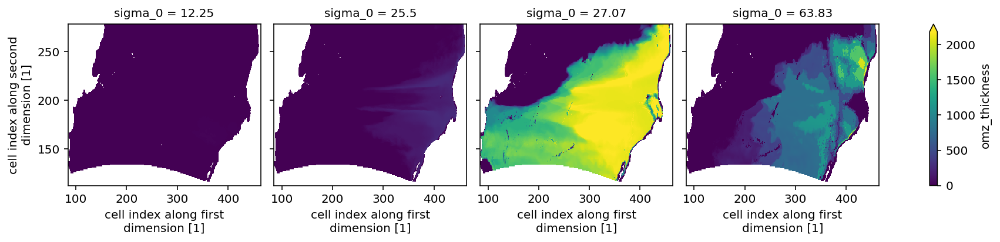

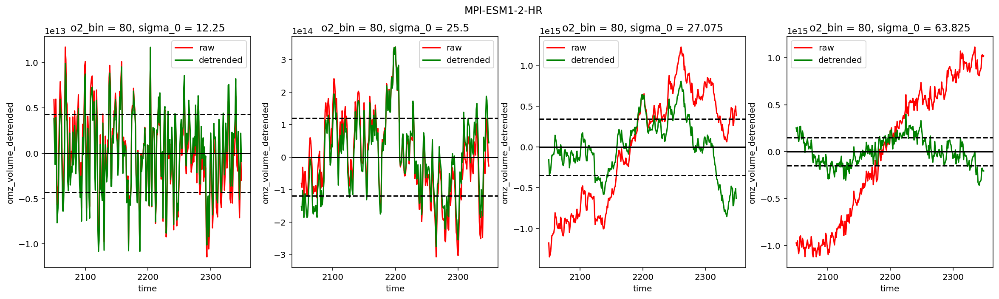

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/core.py:4143: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_MPI-ESM1-2-LR.nc
$ Start loading
[########################################] | 100% Completed |  7.9s
$ Saving 0.00015728GB to ../../data/processed/omz_natural_variability/omz_natural_variability_MPI-ESM1-2-LR.nc
$ Reloading file


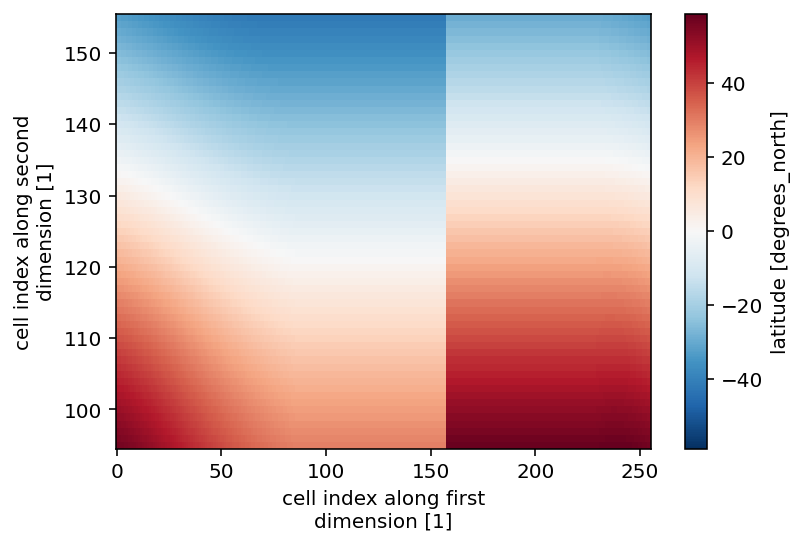

<Figure size 432x288 with 0 Axes>

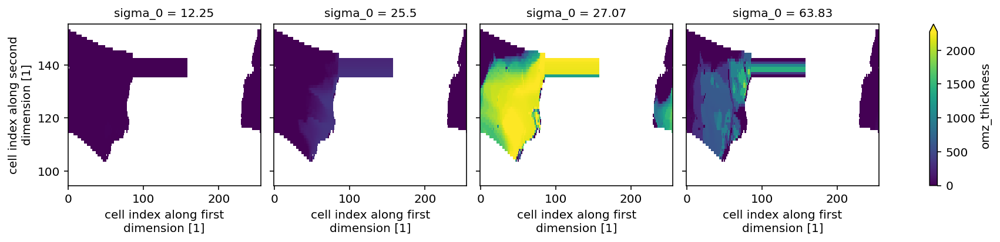

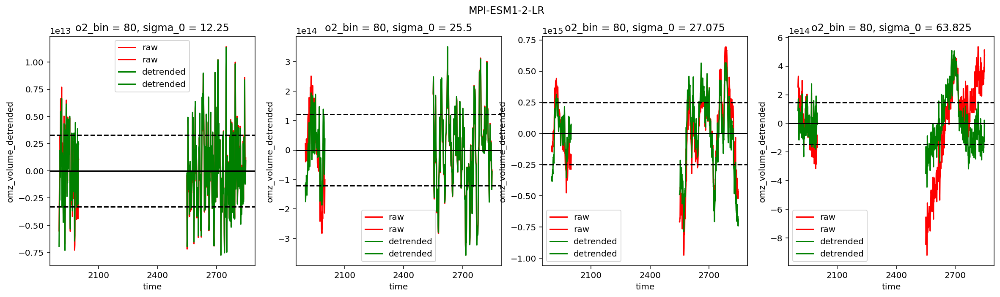

Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_MRI-ESM2-0.nc
$ Start loading
[########################################] | 100% Completed |  5.6s
$ Saving 5.0472e-05GB to ../../data/processed/omz_natural_variability/omz_natural_variability_MRI-ESM2-0.nc
$ Reloading file


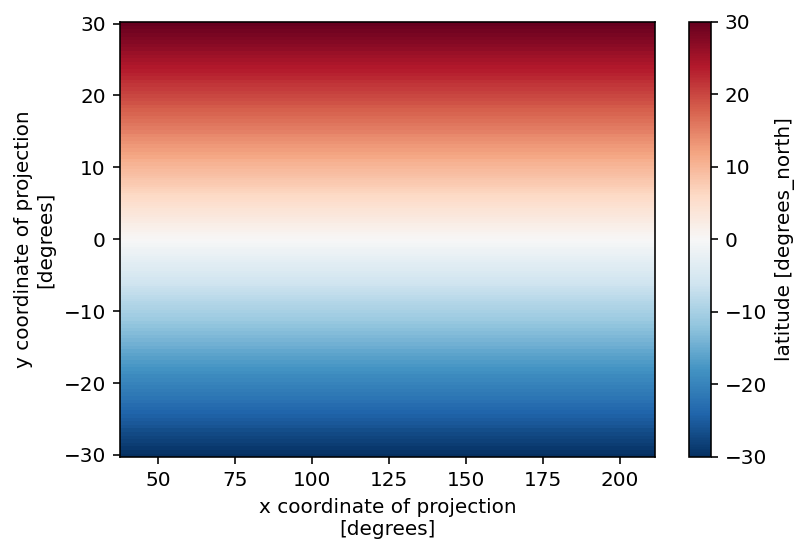

<Figure size 432x288 with 0 Axes>

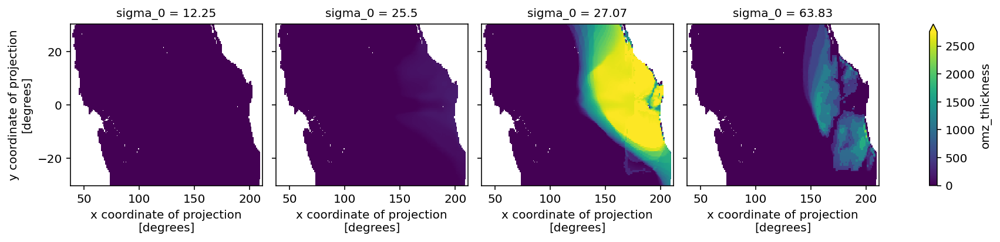

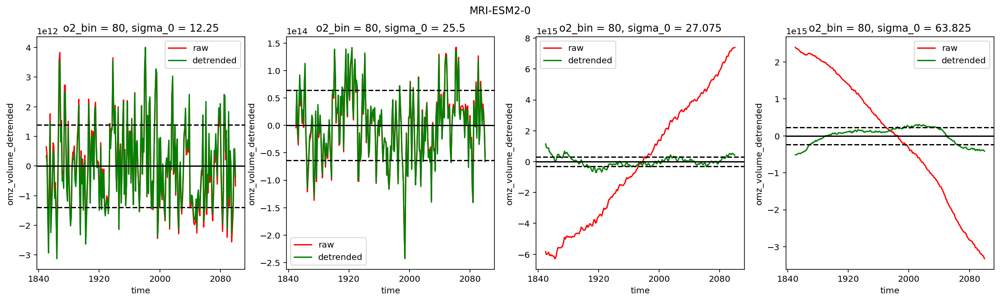

Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_NorESM2-LM.nc
$ Start loading
[########################################] | 100% Completed |  7.8s
$ Saving 6.0272e-05GB to ../../data/processed/omz_natural_variability/omz_natural_variability_NorESM2-LM.nc
$ Reloading file


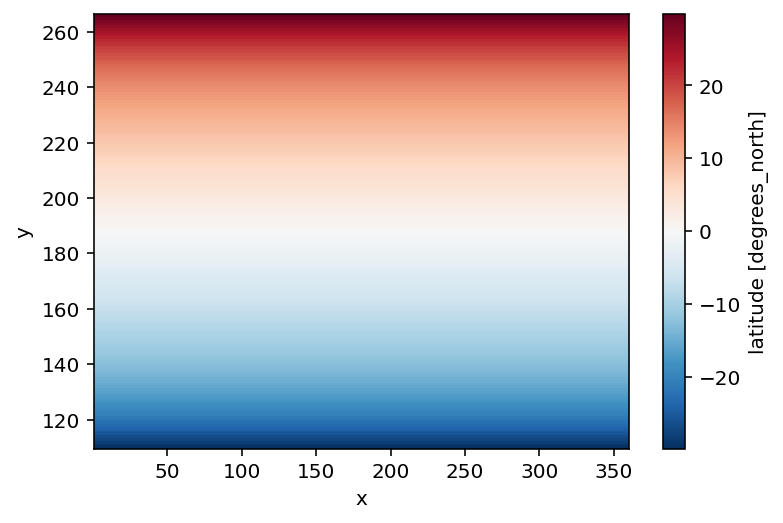

<Figure size 432x288 with 0 Axes>

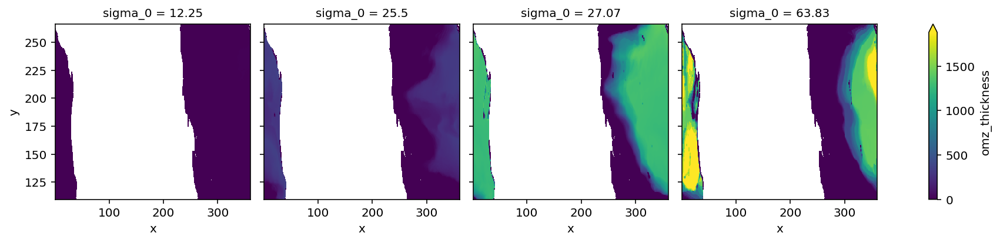

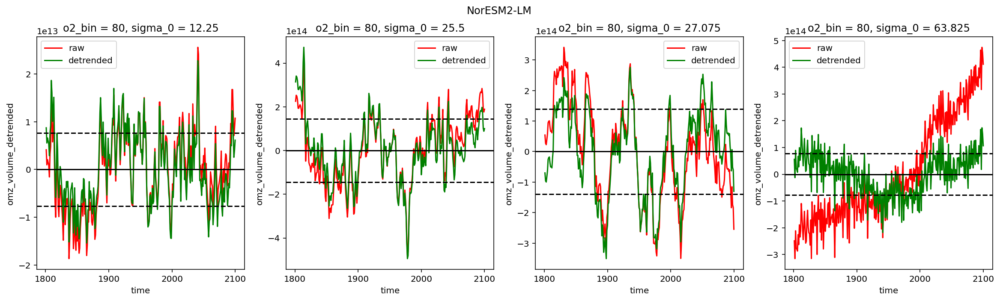

Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_NorESM2-MM.nc
$ Start loading
[########################################] | 100% Completed |  7.7s
$ Saving 6.0272e-05GB to ../../data/processed/omz_natural_variability/omz_natural_variability_NorESM2-MM.nc
$ Reloading file


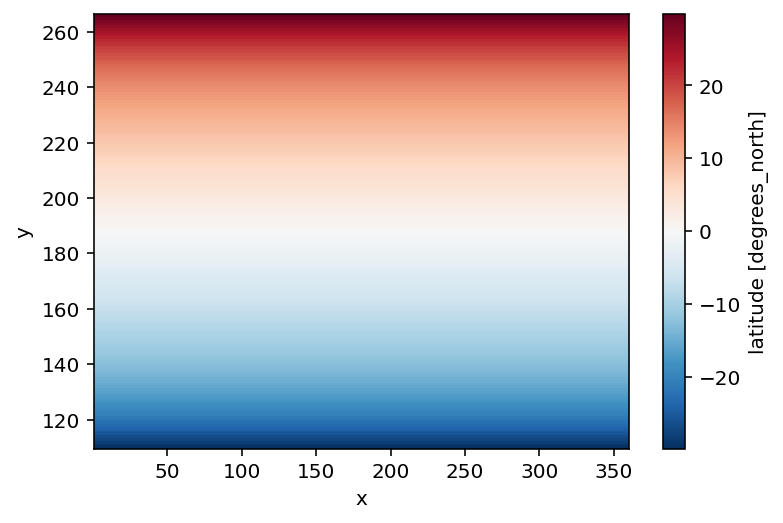

<Figure size 432x288 with 0 Axes>

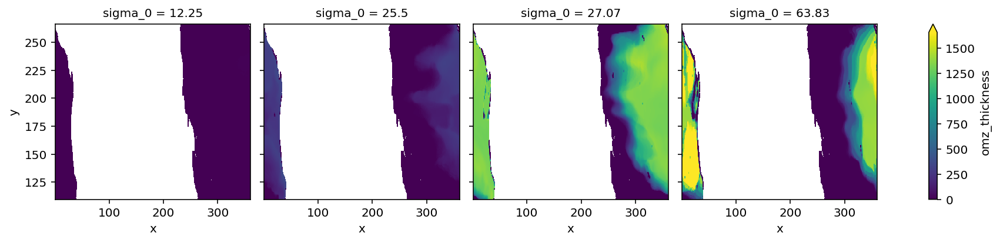

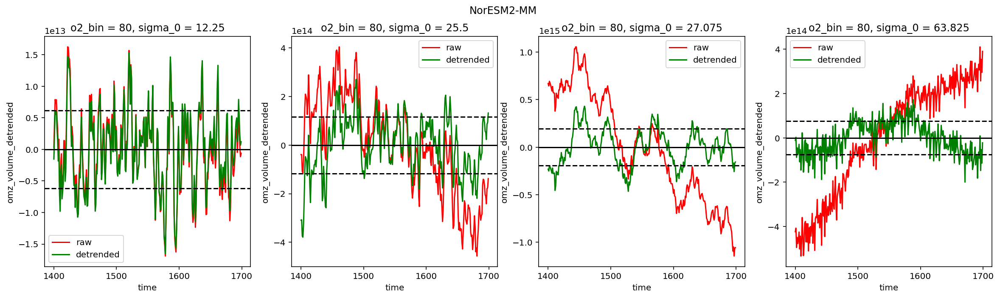

Removing incomplete file ../../data/processed/omz_natural_variability/omz_natural_variability_UKESM1-0-LL.nc
$ Start loading
[#######                                 ] | 19% Completed |  1.3s

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


[########################################] | 100% Completed |  6.9s
$ Saving 6.0272e-05GB to ../../data/processed/omz_natural_variability/omz_natural_variability_UKESM1-0-LL.nc
$ Reloading file


/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


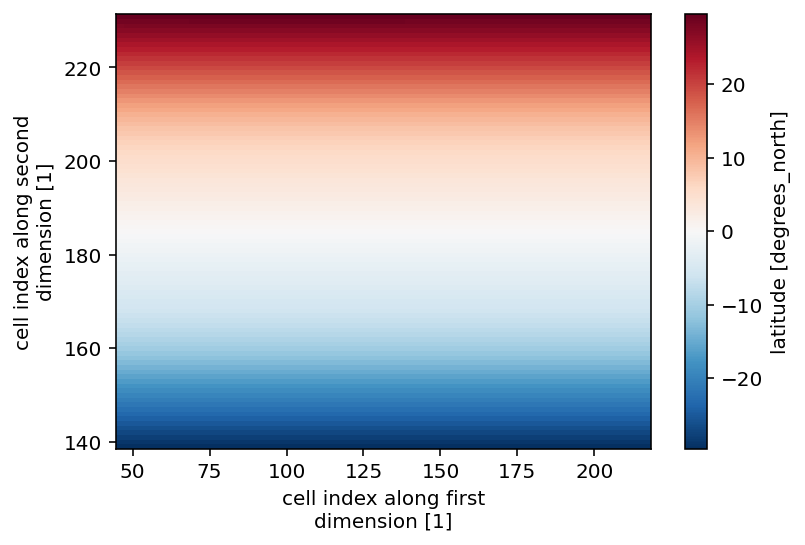

<Figure size 432x288 with 0 Axes>

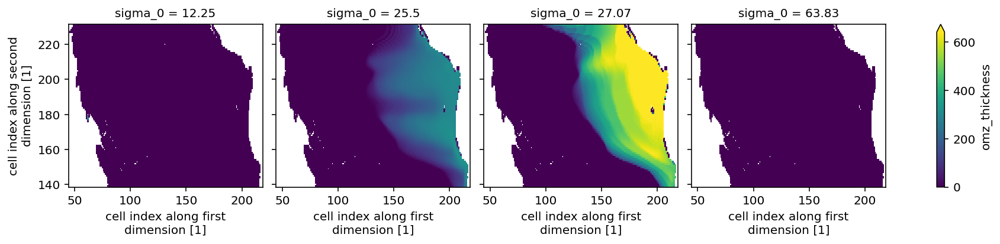

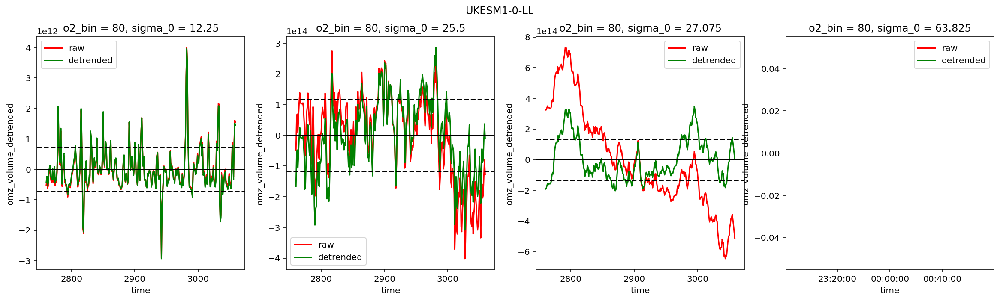

In [19]:
# save out the natural variability
ofolder = maybe_create_folder("../../data/processed/omz_natural_variability/")

# ddict_control_detrended = {}
for si in source_ids:
    control = ddict_merged[si].get("piControl", None)
    if control is not None:
        control = region(control)
        control_omz_vol = omz_volume(control)
        reg = linear_trend(control_omz_vol, "time")
        control_omz_vol_detrended = detrend_basic(
            control_omz_vol, reg.slope, start_idx=0
        )

        # now quantify the variability
        natural_variability = control_omz_vol_detrended.std("time")

        ds_nat_var = xr.Dataset(
            {
                "omz_volume_detrended": control_omz_vol_detrended,
                "omz_volume_natural_variability": natural_variability,
            }
        )
        #                 ds_nat_var = ds_nat_var.load()
        #         ddict_control_detrended[si] = ds_nat_var

        filename = f"omz_natural_variability_{si}.nc"
        with ProgressBar():
            ds_nat_var = write(
                ds_nat_var,
                ofolder.joinpath(filename),
                serialize_load_over_dim=False,
                overwrite=overwrite,
            )

        nsigma = len(control_omz_vol.sigma_0)
        o2_bin = 80

        plt.figure()
        control.lat.plot()

        plt.figure()
        control.omz_thickness.sel(o2_bin=80).isel(
            time=10, member_id=0, missing_dims="ignore"
        ).plot(col="sigma_0", robust=True)

        fig, axarr = plt.subplots(ncols=nsigma, figsize=[20, 5])
        for ax, sigma in zip(axarr.flat, range(nsigma)):

            def select_wrapper(ds):
                return ds.sel(o2_bin=o2_bin).isel(sigma_0=sigma)

            raw = select_wrapper(control_omz_vol)
            raw = raw - raw.mean("time")

            det = select_wrapper(ds_nat_var.omz_volume_detrended)
            det = det - det.mean("time")
            baseline = det.mean("time")
            std = select_wrapper(ds_nat_var.omz_volume_natural_variability)
            if "member_id" in baseline.dims:
                baseline = baseline.mean("member_id")
                std = std.mean("member_id")

            raw.plot(ax=ax, label="raw", hue="member_id", color="r")
            det.plot(ax=ax, label="detrended", hue="member_id", color="g")
            ax.legend()

            ax.axhline(baseline, color="k")
            ax.axhline(baseline + std, color="k", ls="--")
            ax.axhline(baseline - std, color="k", ls="--")

        fig.suptitle(si)
        plt.show()

## Control variability explicitly for "Total" OMZ
Adding the std from thermocline and intermediate waters might very well overestimate the variability, since there is likely some compensation between the volumes of both layers

Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_ACCESS-ESM1-5.nc
$ Start loading
[########################################] | 100% Completed |  5.8s
$ Saving 1.6896e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_ACCESS-ESM1-5.nc
$ Reloading file


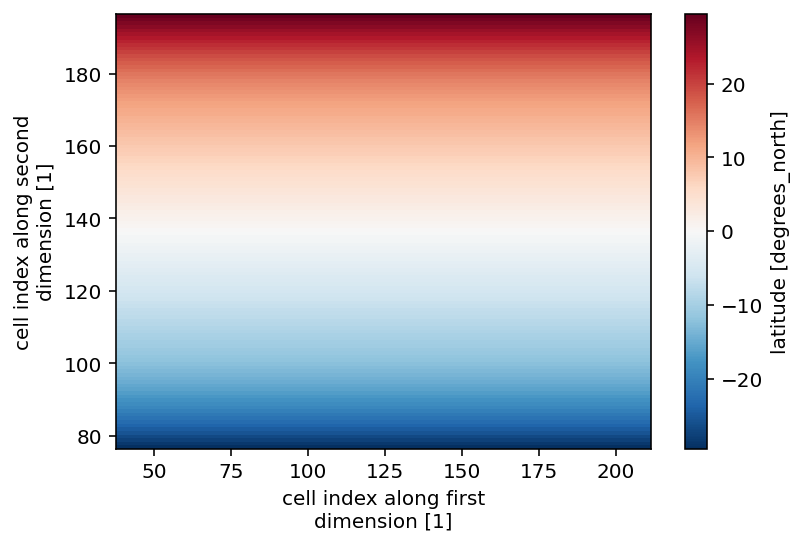

<Figure size 432x288 with 0 Axes>

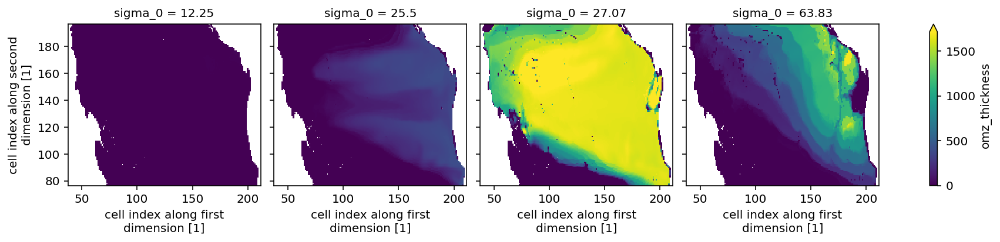

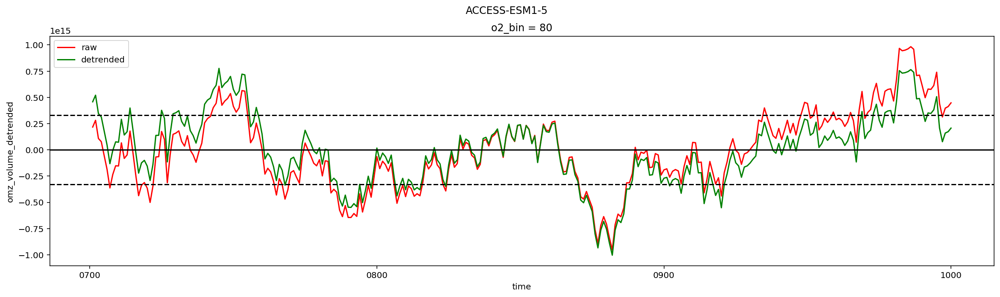

$ Start loading
[########################################] | 100% Completed |  7.2s
$ Saving 1.6896e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_CNRM-ESM2-1.nc
$ Reloading file


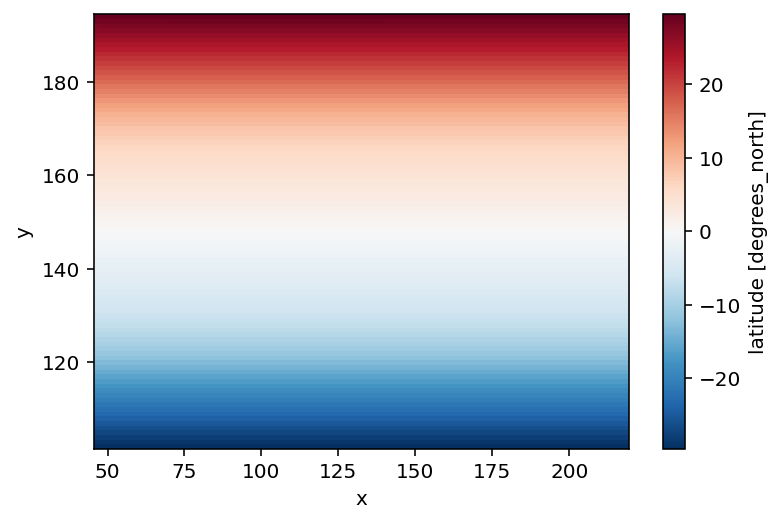

<Figure size 432x288 with 0 Axes>

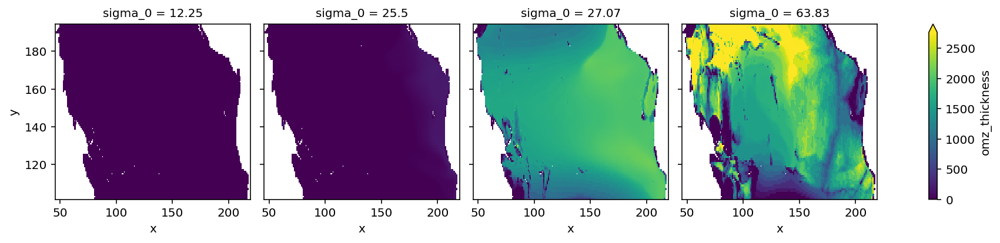

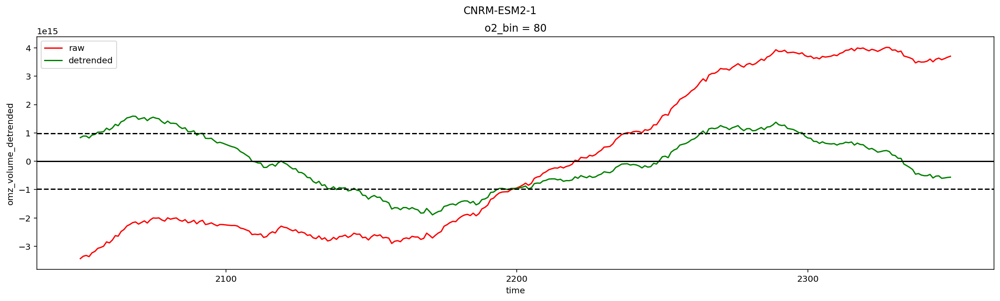

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/core.py:4143: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_CanESM5.nc
$ Start loading
[########################################] | 100% Completed | 30.6s
$ Saving 6.256e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_CanESM5.nc
$ Reloading file


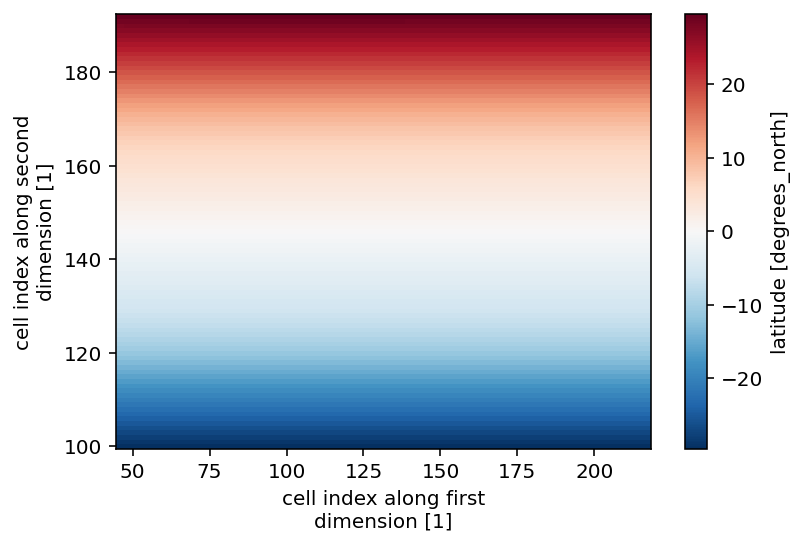

<Figure size 432x288 with 0 Axes>

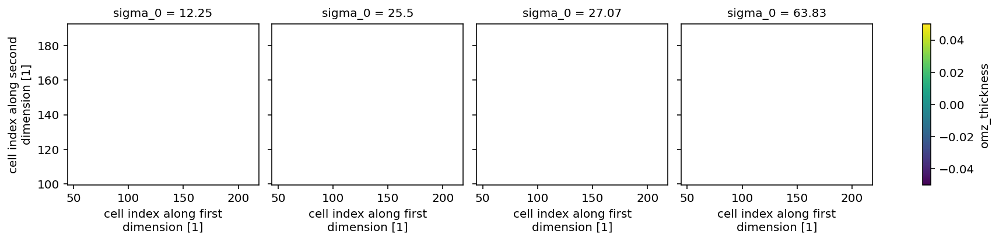

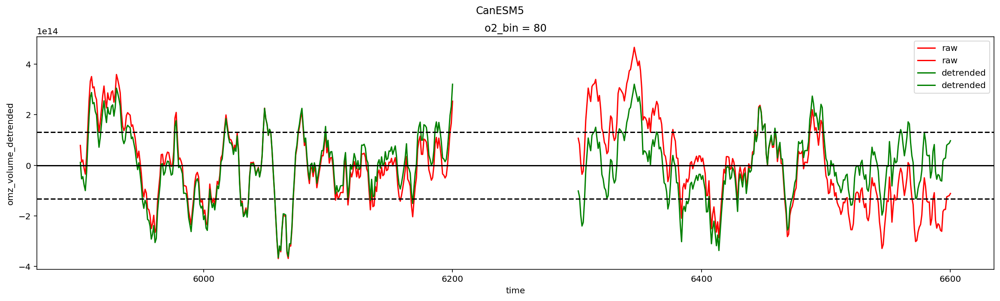

Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_CanESM5-CanOE.nc
$ Start loading
[########################################] | 100% Completed |  7.0s
$ Saving 1.6896e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_CanESM5-CanOE.nc
$ Reloading file


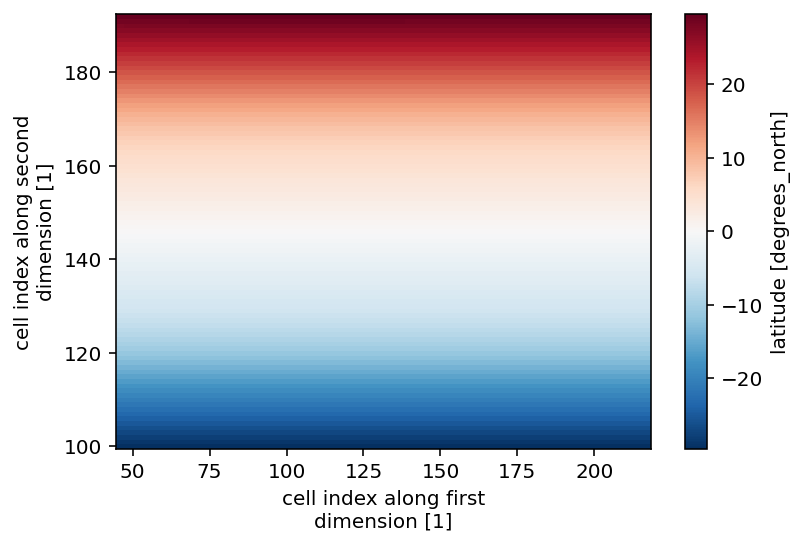

<Figure size 432x288 with 0 Axes>

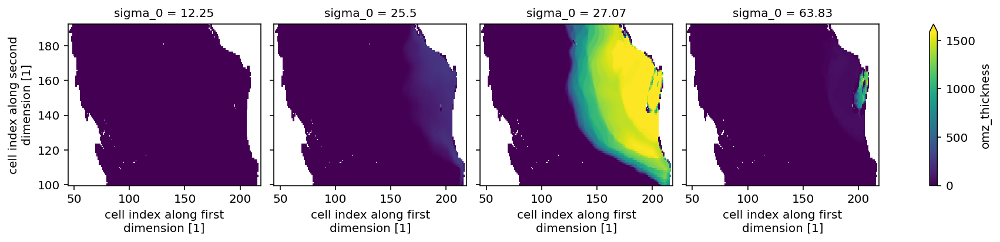

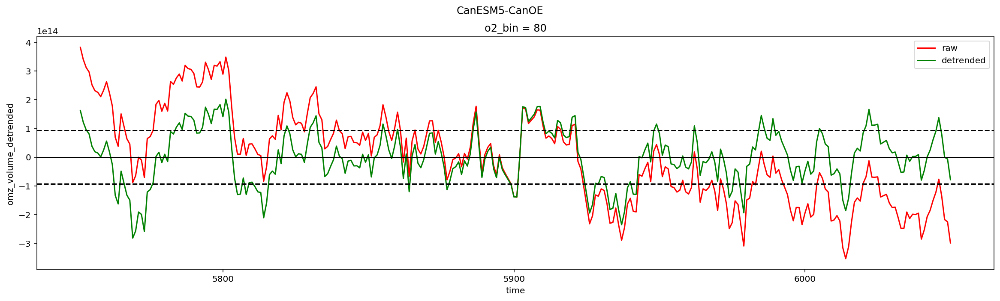

Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_GFDL-CM4.nc
$ Start loading
[########################################] | 100% Completed | 11.9s
$ Saving 1.6896e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_GFDL-CM4.nc
$ Reloading file


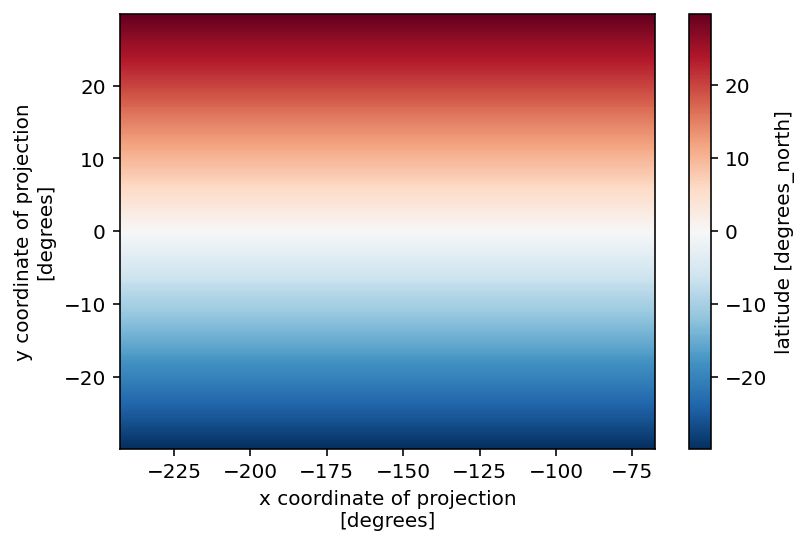

<Figure size 432x288 with 0 Axes>

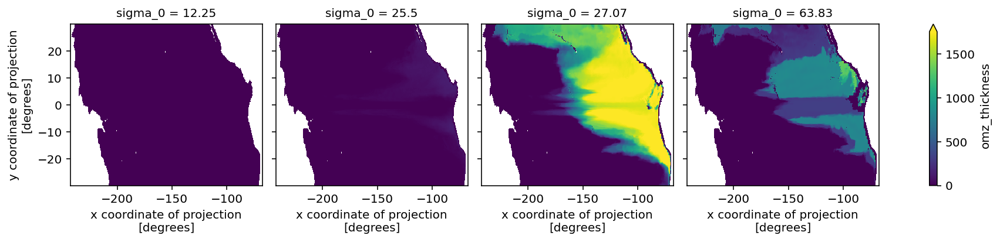

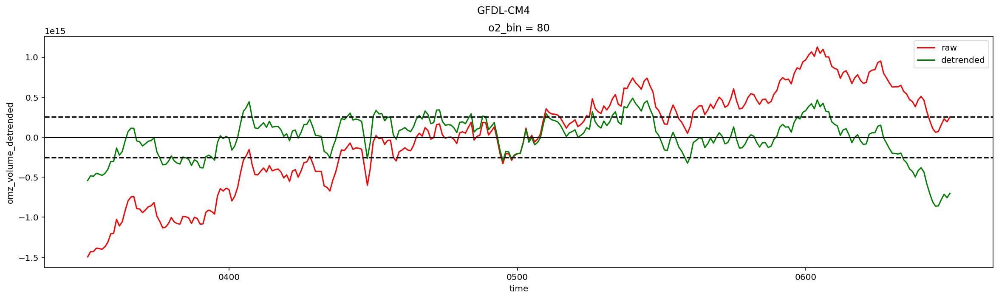

Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_GFDL-ESM4.nc
$ Start loading
[########################################] | 100% Completed |  6.7s
$ Saving 1.6896e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_GFDL-ESM4.nc
$ Reloading file


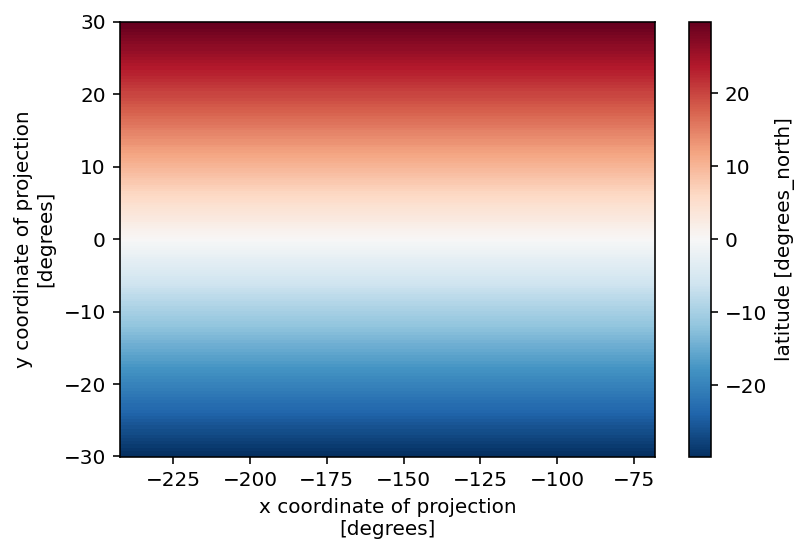

<Figure size 432x288 with 0 Axes>

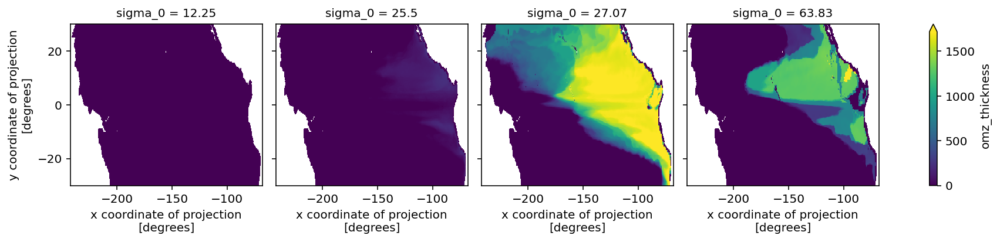

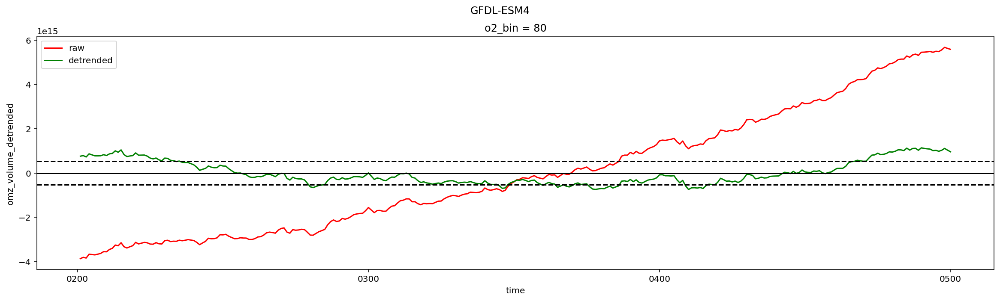

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/core.py:4143: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_IPSL-CM6A-LR.nc
$ Start loading
[########################################] | 100% Completed | 26.7s
$ Saving 5.736e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_IPSL-CM6A-LR.nc
$ Reloading file


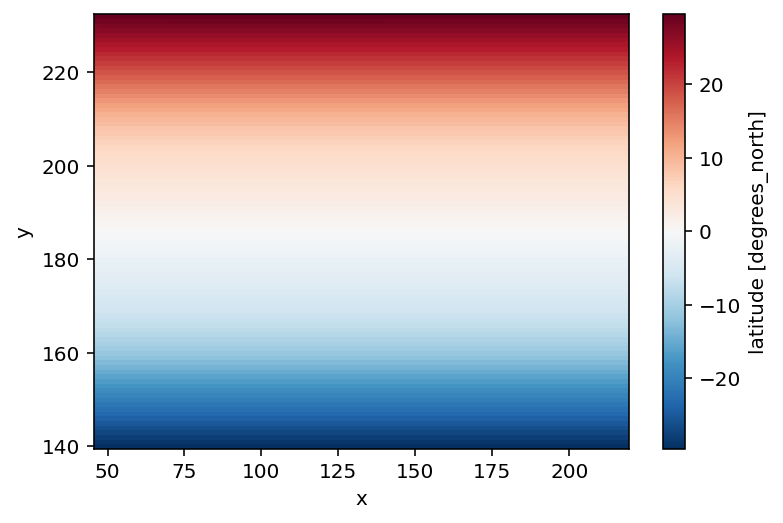

<Figure size 432x288 with 0 Axes>

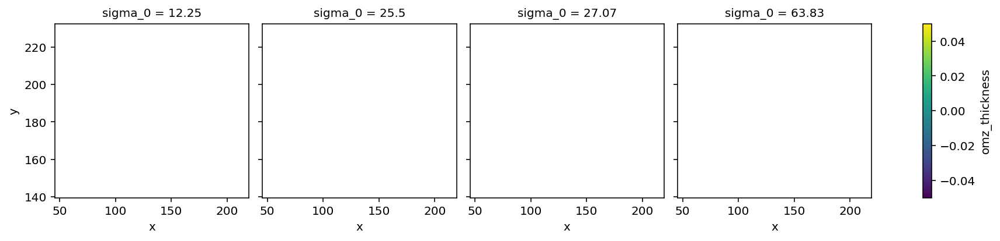

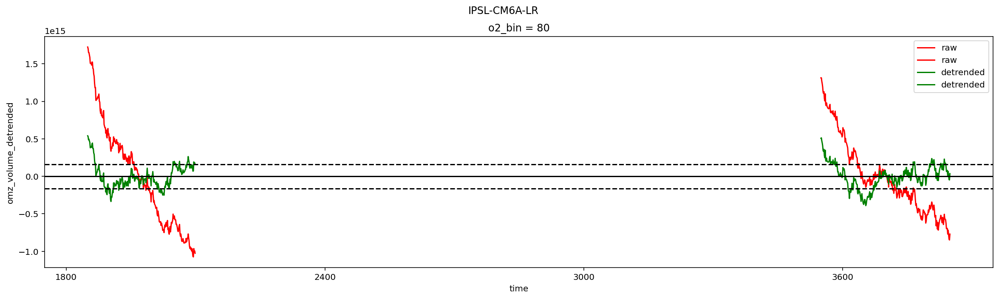

Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_MIROC-ES2L.nc
$ Start loading
[########################################] | 100% Completed |  6.3s
$ Saving 1.6896e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_MIROC-ES2L.nc
$ Reloading file


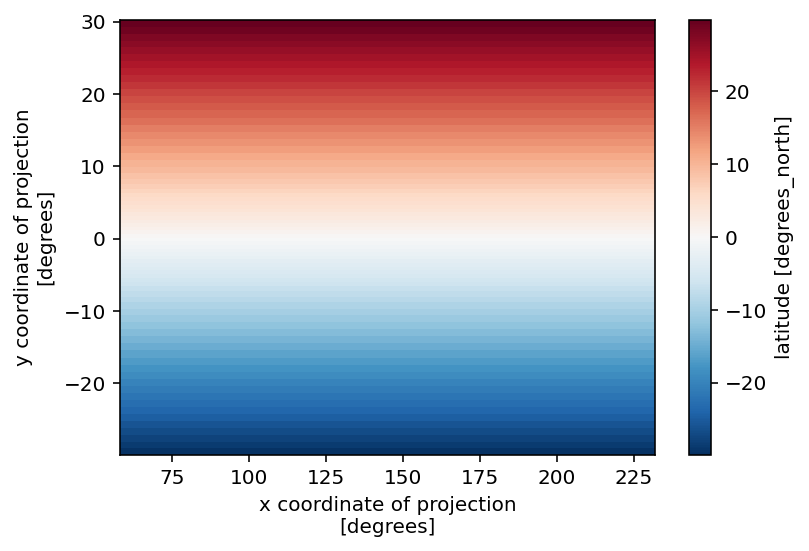

<Figure size 432x288 with 0 Axes>

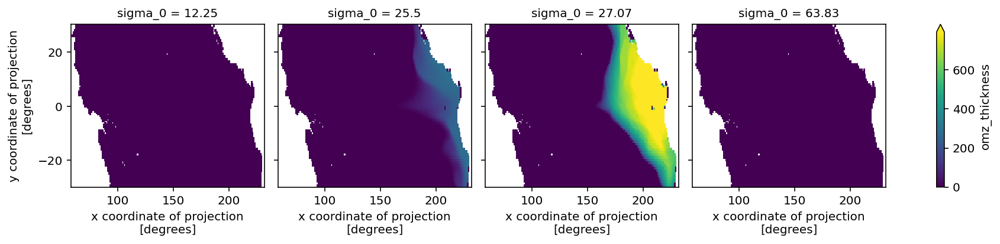

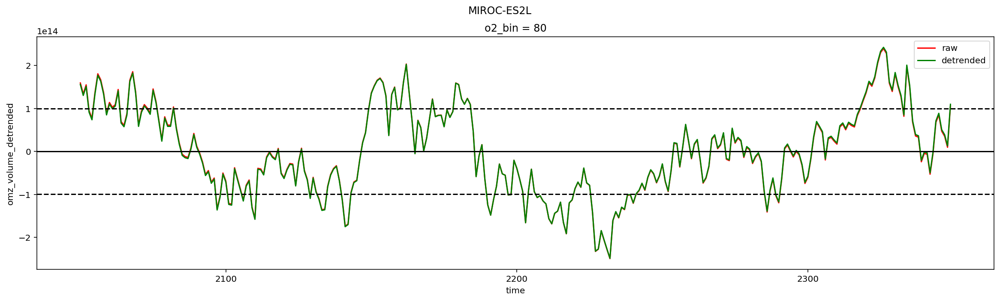

Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_MPI-ESM-1-2-HAM.nc
$ Start loading
[########################################] | 100% Completed |  6.4s
$ Saving 1.6896e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_MPI-ESM-1-2-HAM.nc
$ Reloading file


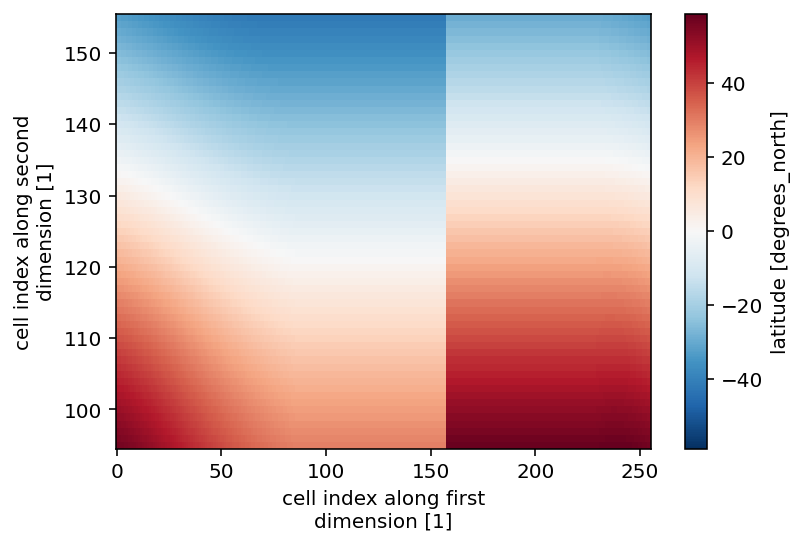

<Figure size 432x288 with 0 Axes>

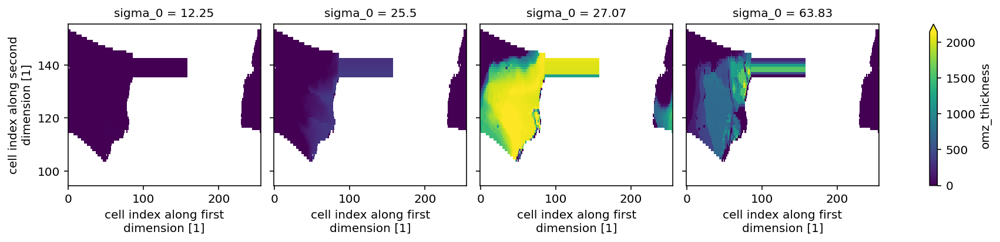

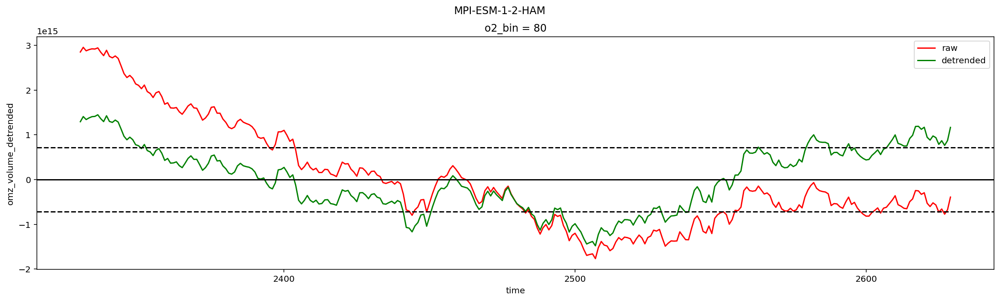

Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_MPI-ESM1-2-HR.nc
$ Start loading
[########################################] | 100% Completed |  7.0s
$ Saving 1.6896e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_MPI-ESM1-2-HR.nc
$ Reloading file


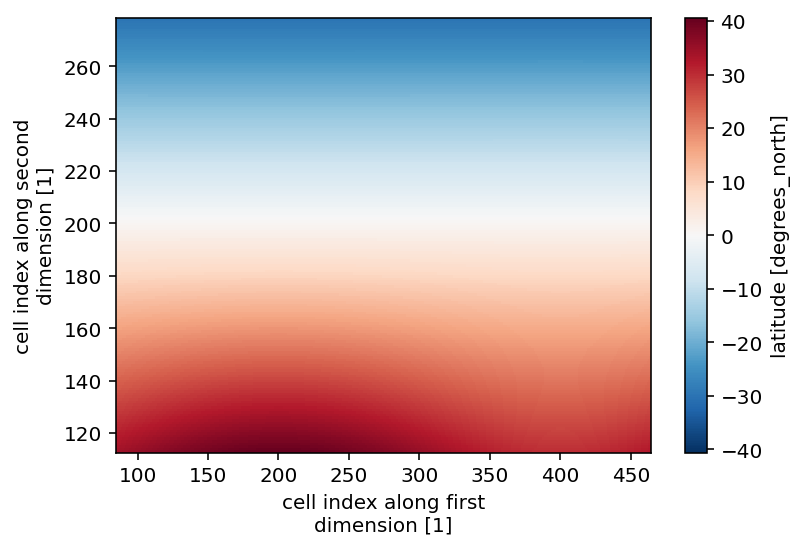

<Figure size 432x288 with 0 Axes>

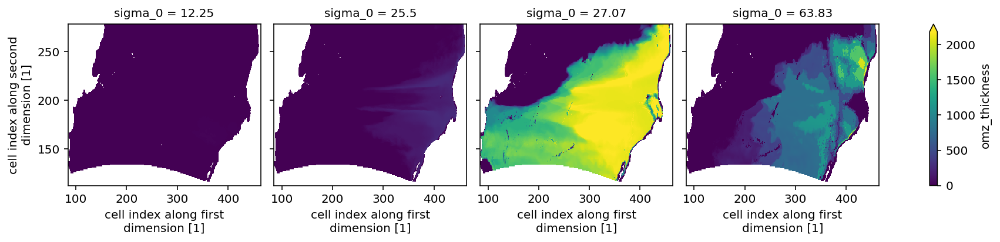

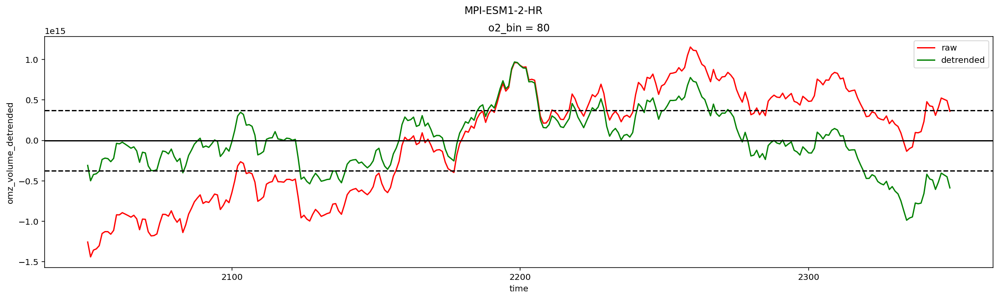

/scratch/gpfs/jbusecke/conda_tigercpu/envs/aguadv_omz_busecke_2021/lib/python3.8/site-packages/dask/array/core.py:4143: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(


Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_MPI-ESM1-2-LR.nc
$ Start loading
[########################################] | 100% Completed |  9.0s
$ Saving 4.176e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_MPI-ESM1-2-LR.nc
$ Reloading file


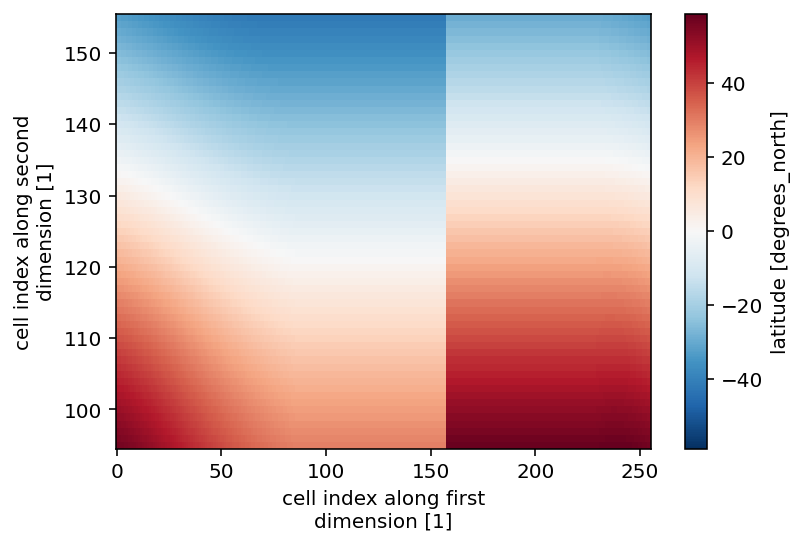

<Figure size 432x288 with 0 Axes>

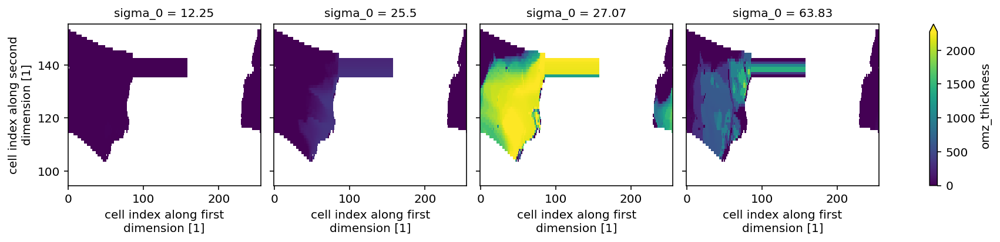

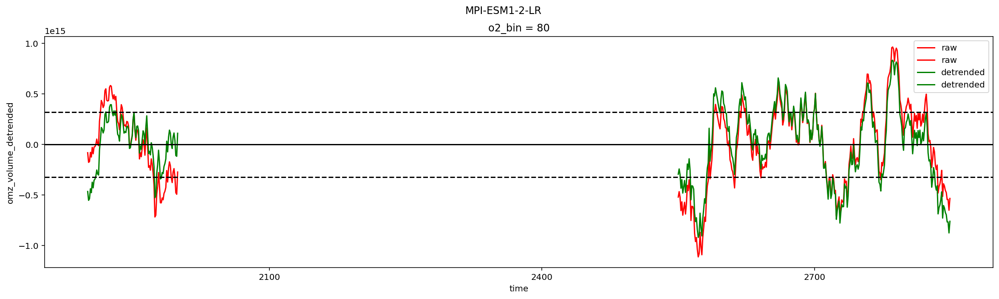

Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_MRI-ESM2-0.nc
$ Start loading
[########################################] | 100% Completed |  7.1s
$ Saving 1.4152e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_MRI-ESM2-0.nc
$ Reloading file


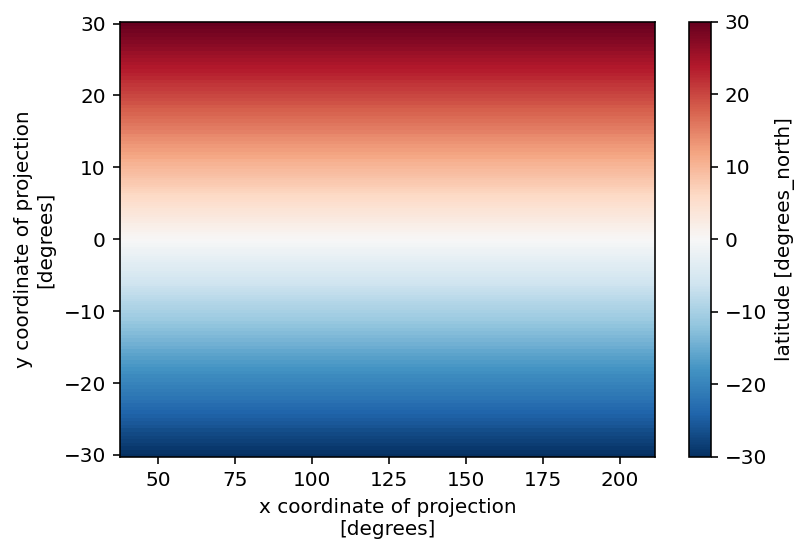

<Figure size 432x288 with 0 Axes>

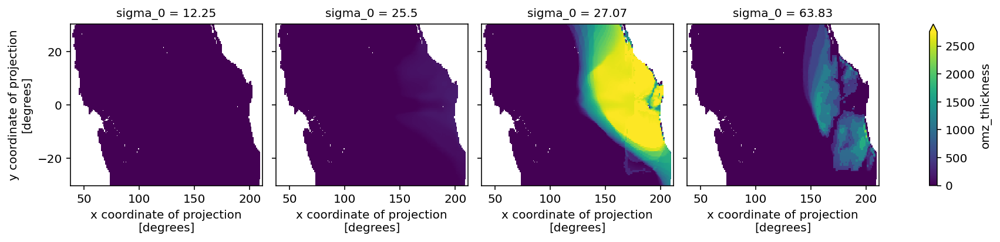

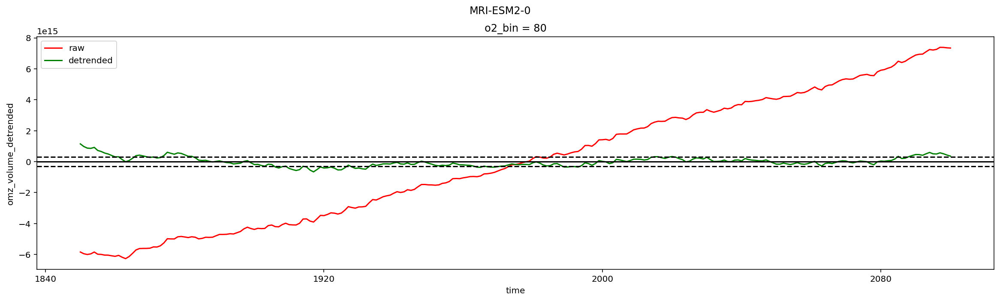

Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_NorESM2-LM.nc
$ Start loading
[########################################] | 100% Completed |  8.7s
$ Saving 1.6896e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_NorESM2-LM.nc
$ Reloading file


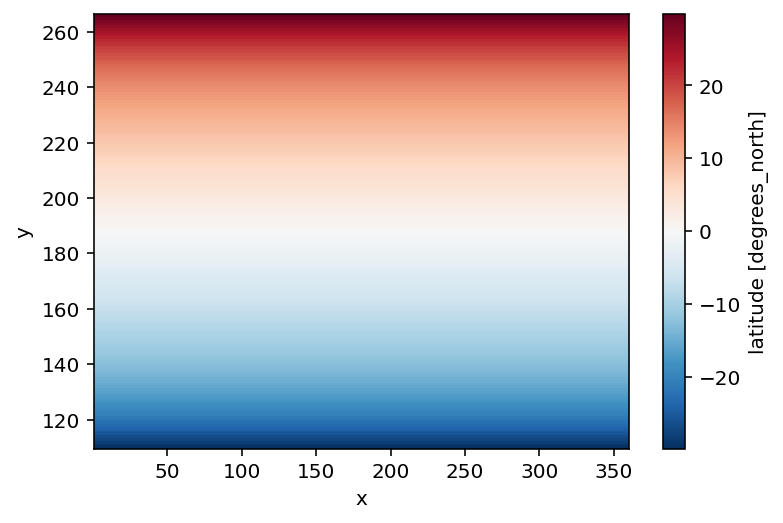

<Figure size 432x288 with 0 Axes>

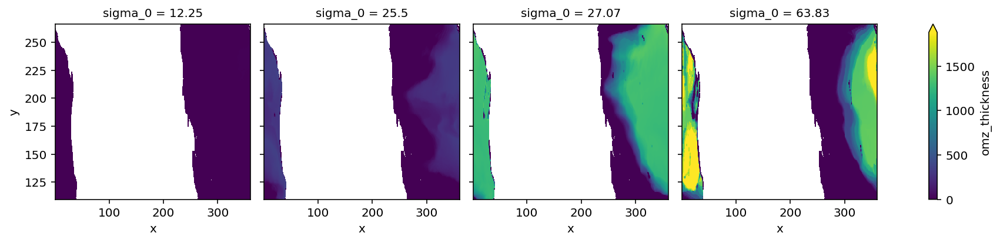

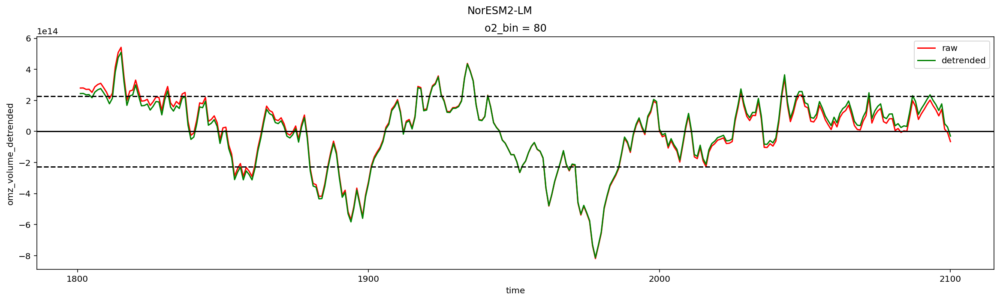

Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_NorESM2-MM.nc
$ Start loading
[########################################] | 100% Completed |  6.8s
$ Saving 1.6896e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_NorESM2-MM.nc
$ Reloading file


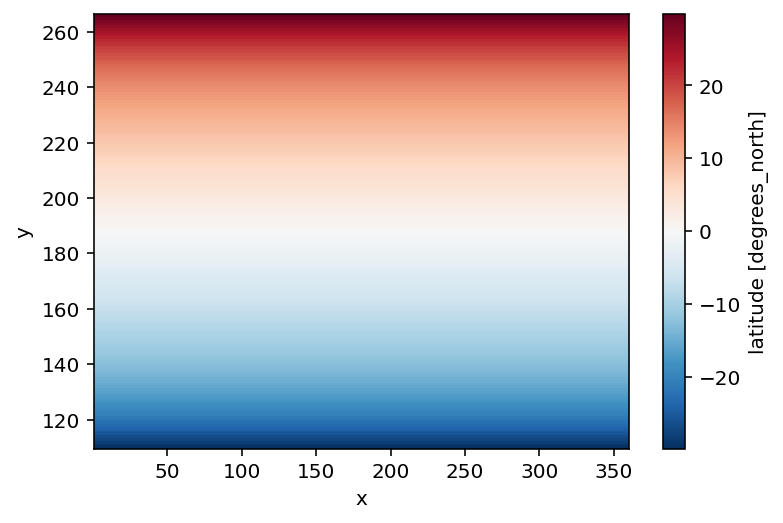

<Figure size 432x288 with 0 Axes>

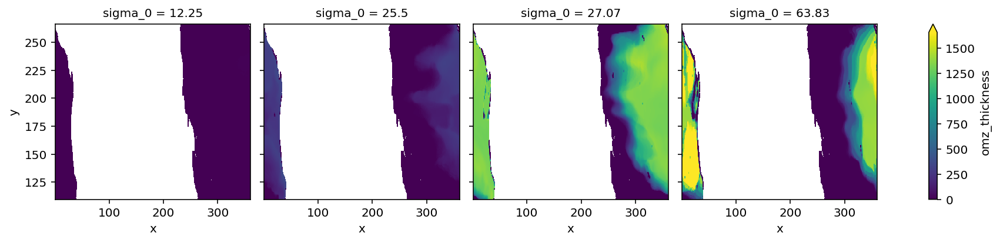

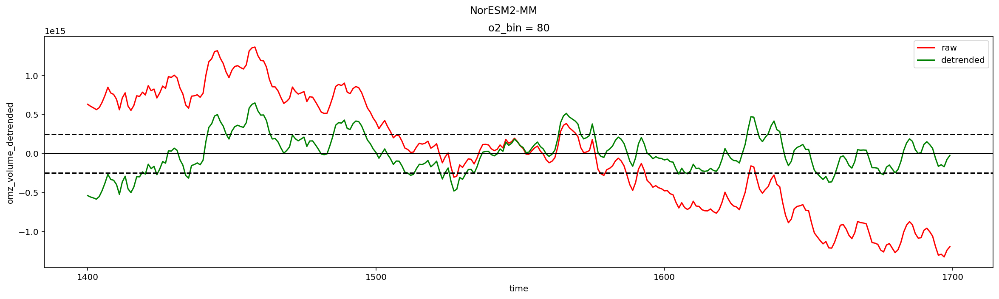

Removing incomplete file ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_UKESM1-0-LL.nc
$ Start loading
[########################################] | 100% Completed |  7.0s
$ Saving 1.6896e-05GB to ../../data/processed/omz_natural_variability_total_omz/omz_natural_variability_total_UKESM1-0-LL.nc
$ Reloading file


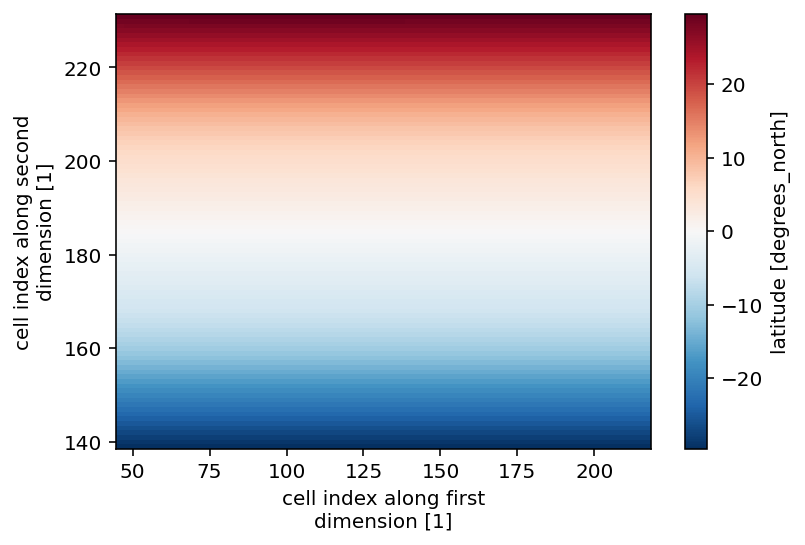

<Figure size 432x288 with 0 Axes>

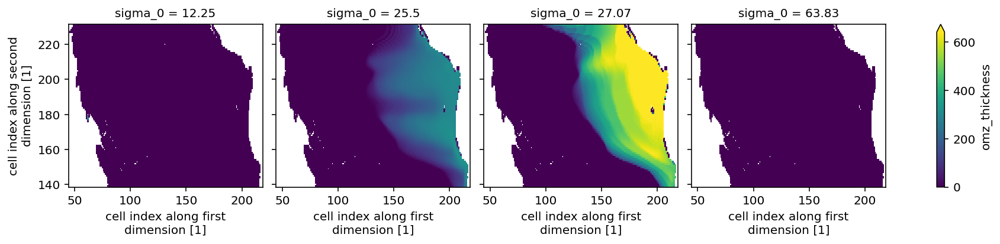

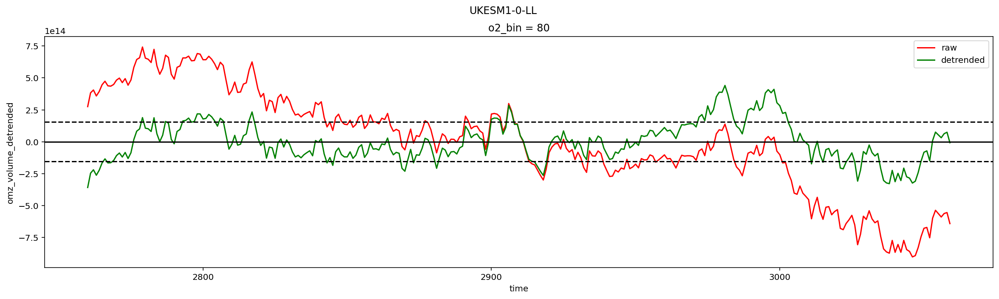

In [18]:
# save out the natural variability
ofolder = maybe_create_folder("../../data/processed/omz_natural_variability_total_omz/")

# ddict_control_detrended = {}
for si in source_ids:
    control = ddict_merged[si].get("piControl", None)
    if control is not None:
        control = region(control)
        control_omz_vol = omz_volume(control).isel(sigma_0=[1,2]).sum('sigma_0')
        #needs another pass to erase zeros for all nan members due to the sum
        control_omz_vol = control_omz_vol.where(control_omz_vol>1)
        
        reg = linear_trend(control_omz_vol, "time")
        control_omz_vol_detrended = detrend_basic(
            control_omz_vol, reg.slope, start_idx=0
        )

        # now quantify the variability
        natural_variability = control_omz_vol_detrended.std("time")

        ds_nat_var = xr.Dataset(
            {
                "omz_volume_detrended": control_omz_vol_detrended,
                "omz_volume_natural_variability": natural_variability,
            }
        )
        #                 ds_nat_var = ds_nat_var.load()
        #         ddict_control_detrended[si] = ds_nat_var

        filename = f"omz_natural_variability_total_{si}.nc"
        with ProgressBar():
            ds_nat_var = write(
                ds_nat_var,
                ofolder.joinpath(filename),
                serialize_load_over_dim=False,
                overwrite=overwrite,
            )

        o2_bin = 80

        plt.figure()
        control.lat.plot()

        plt.figure()
        control.omz_thickness.sel(o2_bin=80).isel(
            time=10, member_id=0, missing_dims="ignore"
        ).plot(col="sigma_0", robust=True)

        fig, ax = plt.subplots(figsize=[20, 5])

        def select_wrapper(ds):
            return ds.sel(o2_bin=o2_bin)

        raw = select_wrapper(control_omz_vol)
        raw = raw - raw.mean("time")

        det = select_wrapper(ds_nat_var.omz_volume_detrended)
        det = det - det.mean("time")
        baseline = det.mean("time")
        std = select_wrapper(ds_nat_var.omz_volume_natural_variability)
        if "member_id" in baseline.dims:
            baseline = baseline.mean("member_id")
            std = std.mean("member_id")

        raw.plot(ax=ax, label="raw", hue="member_id", color="r")
        det.plot(ax=ax, label="detrended", hue="member_id", color="g")
        ax.legend()

        ax.axhline(baseline, color="k")
        ax.axhline(baseline + std, color="k", ls="--")
        ax.axhline(baseline - std, color="k", ls="--")

        fig.suptitle(si)
        plt.show()

# Older stuff

In [ ]:
# first plot....uhhhhhh

freq = "3AS"

fig, axarr = plt.subplots(ncols=4, nrows=len(ddict_full), figsize=[26, 40])

for i, (si, ds) in enumerate(ddict_full.items()):
    print(si)
    for sigma in range(4):
        ax = axarr[i, sigma]
        da = omz_to_plot(ds, freq, sigma)
        da.plot(hue="member_id", ax=ax)

        # find a reference for the variability
        cont = omz_to_plot(ddict_merged[si]["piControl"], freq, sigma)

        # detrend and diagnose std from the raw omz_volume
        cont_raw = omz_volume(ddict_merged[si]["piControl"])
        

        if "member_id" not in cont.dims:
            cont = cont.expand_dims("member_id")

        for member in cont.member_id:
            cont_single = cont.sel(member_id=member).squeeze()
            cont_single = cont_single.isel(time=~np.isnan(cont_single))
            if freq:
                cont_single = replace_time(cont_single, da.time.data[0], freq=freq)
            cont_single.plot(color="0.3", add_legend=False, lw=2, ax=ax)

        ax.set_title(si)
        axarr[0, sigma].set_title(f"Density layer: {ds.sigma_0.data[sigma]}")

plt.show()

# Additional Checks

## Check if the average of linear trends is the same as the trend of the average

I dont get it... this does not work out...but I think it should...

In [ ]:
test_da = ddict_full['ACCESS-ESM1-5'].thetao.isel(sigma_0=1)
# reg_single = linear_trend(test_da, 'time').mean(['x', 'y'])
# reg_all = linear_trend(test_da.mean(['x', 'y']), 'time')

reg_single = test_da.mean('time').mean(['x', 'y'])
reg_all = test_da.mean(['x', 'y']).mean('time')

with ProgressBar():
    xr.testing.assert_allclose(reg_single, reg_all)